In [1]:
import pandas as pd
from geovectorslib import direct, inverse
import numpy as np
from tqdm.notebook import tqdm

In [23]:
df_lb = pd.read_csv('Landbank_data_with_coordinates.csv').drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1)
df_lb.head()

,filename,category,file_path,Address,fov,Latitude,Longitude
0,10147_N_GREEN_HILLS_RD_facing=90.jpg.Occupied.jpg,Occupied,LandBank_Data\10147_N_GREEN_HILLS_RD_facing=90...,10147 N GREEN HILLS RD,facing=90,39.278070,-94.630190
1,103_W_19TH_ST_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\103_W_19TH_ST_facing=60.jpg.Occu...,103 W 19TH ST,facing=60,39.090750,-94.585380
2,106_W_14th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\106_W_14th_St_facing=60.jpg.Occu...,106 W 14th St,facing=60,39.097570,-94.584720
3,1102_Agnes_Ave_facing=180.jpg.Abandoned.jpg,Abandoned,LandBank_Data\1102_Agnes_Ave_facing=180.jpg.Ab...,1102 Agnes Ave,facing=180,39.100312,-94.547036
4,1116_E_44th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\1116_E_44th_St_facing=60.jpg.Occ...,1116 E 44th St,facing=60,39.047430,-94.571810


In [30]:
# nbhnames, nbhids, blockids, districts, policedivisionIDs, policeDivisions = [], [], [], [], [], []
for i, row in tqdm(df_lb.iterrows(), total = df_lb.shape[0]):
    lat, lng = row['Latitude'], row['Longitude']
    query = {'lat':lat, 'lng':lng}
    response = requests.get('http://nsfscc-bert.ngrok.io/getGeoLocations', params=query).json()
    nbhnames.append(response['nbhname'])
    nbhids.append(response['nbhid'])
    blockids.append(response['block_id'])
    districts.append(response['district'])
    policedivisionIDs.append(response['division'])
    policeDivisions.append(response['divisionname'])


  0%|          | 0/106 [00:00<?, ?it/s]

In [33]:
df_lb['nbhname'] = nbhnames  
df_lb['nbhid'] = nbhids  
df_lb['block_id'] = blockids  
df_lb['district'] = districts  
df_lb['division'] = policedivisionIDs  
df_lb['divisionname'] = policeDivisions  

In [34]:
df_lb.to_csv('landbank_bhuvan_with_nbhids.csv', index = False)

In [926]:
df_lb.head()

,filename,category,file_path,Address,fov,Latitude,Longitude,nbhname,nbhid,block_id,district,division,divisionname
0,10147_N_GREEN_HILLS_RD_facing=90.jpg.Occupied.jpg,Occupied,LandBank_Data\10147_N_GREEN_HILLS_RD_facing=90...,10147 N GREEN HILLS RD,facing=90,39.278070,-94.630190,KCI & 2nd Creek,231,2.916503e+11,2.0,4.0,North
1,103_W_19TH_ST_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\103_W_19TH_ST_facing=60.jpg.Occu...,103 W 19TH ST,facing=60,39.090750,-94.585380,Crossroads,7,2.909502e+11,4.0,1.0,Central
2,106_W_14th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\106_W_14th_St_facing=60.jpg.Occu...,106 W 14th St,facing=60,39.097570,-94.584720,CBD Downtown,4,2.909502e+11,4.0,1.0,Central
3,1102_Agnes_Ave_facing=180.jpg.Abandoned.jpg,Abandoned,LandBank_Data\1102_Agnes_Ave_facing=180.jpg.Ab...,1102 Agnes Ave,facing=180,39.100312,-94.547036,Independence Plaza,16,2.909500e+11,4.0,3.0,East
4,1116_E_44th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\1116_E_44th_St_facing=60.jpg.Occ...,1116 E 44th St,facing=60,39.047430,-94.571810,Manheim Park,69,2.909501e+11,3.0,1.0,Central


<h1>Visualize abandoned LB

In [10]:
import bokeh, bokeh.plotting, bokeh.models
from bokeh.io import output_notebook, show
output_notebook()
import pandas as pd
import geopandas
import matplotlib.pyplot as plt
import json
from bokeh.plotting import figure, output_file, show, ColumnDataSource
from bokeh.models import GlyphRenderer, Circle, GeoJSONDataSource

Loading BokehJS ...

In [24]:
df_lb = pd.read_csv('landbank_bhuvan_with_nbhids.csv').dropna()
df_lb['nbhid'] = df_lb['nbhid'].astype(int)
# df_lb = pd.read_csv('Land_Bank_and_Kansas_City_Missouri_Homesteading_Authority_Data.csv')
# df_311 = pd.read_csv('../data/raw/311_Calls_2007-2020.csv')
df_shape = pd.read_csv('../Census/240NBH_socioeconomic_withshapes.csv')

In [86]:
df_lb.head()

,filename,category,file_path,Address,fov,Latitude,Longitude,nbhname,nbhid,block_id,district,division,divisionname
0,10147_N_GREEN_HILLS_RD_facing=90.jpg.Occupied.jpg,Occupied,LandBank_Data\10147_N_GREEN_HILLS_RD_facing=90...,10147 N GREEN HILLS RD,facing=90,39.278070,-94.630190,KCI & 2nd Creek,231.0,2.916503e+11,2.0,4.0,North
1,103_W_19TH_ST_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\103_W_19TH_ST_facing=60.jpg.Occu...,103 W 19TH ST,facing=60,39.090750,-94.585380,Crossroads,7.0,2.909502e+11,4.0,1.0,Central
2,106_W_14th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\106_W_14th_St_facing=60.jpg.Occu...,106 W 14th St,facing=60,39.097570,-94.584720,CBD Downtown,4.0,2.909502e+11,4.0,1.0,Central
3,1102_Agnes_Ave_facing=180.jpg.Abandoned.jpg,Abandoned,LandBank_Data\1102_Agnes_Ave_facing=180.jpg.Ab...,1102 Agnes Ave,facing=180,39.100312,-94.547036,Independence Plaza,16.0,2.909500e+11,4.0,3.0,East
4,1116_E_44th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\1116_E_44th_St_facing=60.jpg.Occ...,1116 E 44th St,facing=60,39.047430,-94.571810,Manheim Park,69.0,2.909501e+11,3.0,1.0,Central


In [32]:
target_bgs = pd.read_csv('KCMO_BGID.csv').astype(str).values.squeeze()

target_bgs

array(['290370601002', '290470204002', '290470212061', '290470205001',
       '290470209021', '290470212065', '290470213071', '290470212071',
       '290470206041', '290470213051', '290470212043', '290470211031',
       '290470222001', '290470212084', '290470202023', '290470213062',
       '290470205005', '290470205004', '290470213032', '290470223021',
       '290470222002', '290470222003', '290470213101', '290470213102',
       '290470212082', '290470212083', '290470212053', '290470212064',
       '290470213054', '290470219002', '290470202013', '290470202011',
       '290470202014', '290470202012', '290470202021', '290470202022',
       '290470204001', '290470212052', '290470212051', '290470212062',
       '290470212063', '290470205006', '290470205003', '290470209022',
       '290470213031', '290470213061', '290470213063', '290470206042',
       '290470206043', '290470206044', '290470206045', '290470211011',
       '290470206033', '290470206031', '290470206032', '290470209011',
      

In [66]:
df_lb['block_id'].dropna().astype(int)

0     -2147483648
1     -2147483648
2     -2147483648
3     -2147483648
4     -2147483648
          ...    
394   -2147483648
395   -2147483648
396   -2147483648
397   -2147483648
398   -2147483648
Name: block_id, Length: 328, dtype: int32

In [77]:
# target_bgs = np.int64(df_lb['block_id'].dropna().unique()).tolist()
# target_bgs

array([291650302011, 292650302013], dtype=int64)

In [28]:
geo_df.head()

,GEOID10,geometry
0,200450008012,"POLYGON ((-95.27920 38.92870, -95.28026 38.928..."
1,200450010023,"POLYGON ((-95.20495 38.93730, -95.20495 38.937..."
2,200450003004,"POLYGON ((-95.24658 38.95253, -95.24658 38.952..."
3,200450005023,"POLYGON ((-95.23660 38.97313, -95.23604 38.973..."
4,200450001001,"POLYGON ((-95.23585 38.97549, -95.23605 38.975..."


In [26]:
'''
Block Group Boundaries
'''
coord_system = {'init': 'epsg:4326'}
bg_geo_df = geopandas.read_file('CensusBG_SHP/Census_blockgroups_2010_2000.shp').to_crs(coord_system)
bg_geo_df = bg_geo_df[['GEOID10','geometry']]
# df = df[df['GEOID10'].isin(target_bgs)]
bg_geo_df.head()

coords_df = pd.read_csv('landbank_bhuvan_with_nbhids.csv')

# coords_df = pd.read_csv('lb_crime_311_coords_2019.csv')

gdf = geopandas.GeoDataFrame(
    coords_df, geometry=geopandas.points_from_xy(coords_df.Longitude, coords_df.Latitude))

'''
NBH Boundaries
'''
with open('../311/Kansas City Neighborhood Boundaries.geojson') as f:
    nbh_json = f.read()
'''
NBH Boundaries with Clusters
'''
with open('Clustering/exports/KMeans/246NBH-2clusters-KMeans.geojson') as f:
    nbh_json_clustered = f.read()

c:\Users\dhh3hb\Anaconda3\envs\geo_env\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [91]:
coords_df.drop_duplicates()

,filename,category,file_path,Address,fov,Latitude,Longitude,nbhname,nbhid,block_id,district,division,divisionname,geometry
0,10147_N_GREEN_HILLS_RD_facing=90.jpg.Occupied.jpg,Occupied,LandBank_Data\10147_N_GREEN_HILLS_RD_facing=90...,10147 N GREEN HILLS RD,facing=90,39.278070,-94.630190,KCI & 2nd Creek,231.0,2.916503e+11,2.0,4.0,North,POINT (-94.63019 39.27807)
1,103_W_19TH_ST_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\103_W_19TH_ST_facing=60.jpg.Occu...,103 W 19TH ST,facing=60,39.090750,-94.585380,Crossroads,7.0,2.909502e+11,4.0,1.0,Central,POINT (-94.58538 39.09075)
2,106_W_14th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\106_W_14th_St_facing=60.jpg.Occu...,106 W 14th St,facing=60,39.097570,-94.584720,CBD Downtown,4.0,2.909502e+11,4.0,1.0,Central,POINT (-94.58472 39.09757)
3,1102_Agnes_Ave_facing=180.jpg.Abandoned.jpg,Abandoned,LandBank_Data\1102_Agnes_Ave_facing=180.jpg.Ab...,1102 Agnes Ave,facing=180,39.100312,-94.547036,Independence Plaza,16.0,2.909500e+11,4.0,3.0,East,POINT (-94.54704 39.10031)
4,1116_E_44th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\1116_E_44th_St_facing=60.jpg.Occ...,1116 E 44th St,facing=60,39.047430,-94.571810,Manheim Park,69.0,2.909501e+11,3.0,1.0,Central,POINT (-94.57181 39.04743)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
394,9322_Myrtle_Ave_facing=90.jpg.Occupied.jpg,Occupied,LandBank_Data\9322_Myrtle_Ave_facing=90.jpg.Oc...,9322 Myrtle Ave,facing=90,38.956420,-94.542710,Hidden Valley,154.0,2.909501e+11,5.0,2.0,Metro,POINT (-94.54271 38.95642)
395,9327_Cleveland_Ave_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\9327_Cleveland_Ave_facing=60.jpg...,9327 Cleveland Ave,facing=60,38.956800,-94.543830,Hidden Valley,154.0,2.909501e+11,5.0,2.0,Metro,POINT (-94.54383 38.95680)
396,935_Broadway_Blvd_facing=90.jpg.Occupied.jpg,Occupied,LandBank_Data\935_Broadway_Blvd_facing=90.jpg....,935 Broadway Blvd,facing=90,39.102560,-94.588030,CBD Downtown,4.0,2.909502e+11,4.0,1.0,Central,POINT (-94.58803 39.10256)
397,9533_Charlotte_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\9533_Charlotte_St_facing=60.jpg....,9533 Charlotte St,facing=60,38.954360,-94.578990,Linden Hills And Indian Heights,142.0,2.909501e+11,6.0,5.0,South,POINT (-94.57899 38.95436)


In [192]:
bokeh.palettes.Category10[10]

('#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf')

In [193]:
# <!-- collapse=True -->
# gjds = bokeh.models.GeoJSONDataSource(geojson=bg_geo_df.to_json())
# gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json)
gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json_clustered)


color_map = {
    "Abandoned": 'red',
    'Occupied': 'green'
}

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(title="246 KCMO Neighborhoods with Bhuvan's Data", tools=TOOLS, plot_width = 400, x_range=(-94.8, -94.3), y_range=(38.8, 39.4), x_axis_location = None, y_axis_location = None)
# p = bokeh.plotting.figure(title="462 Block Groups", tools=TOOLS)
color_mapper = bokeh.models.LinearColorMapper(palette=bokeh.palettes.Category10[10])

p.patches('xs', 'ys', 
          fill_color={'field': 'cluster_by_population', 'transform': color_mapper},
          # fill_color = 'lightgray',
          fill_alpha=1., line_color="black", line_width=0.5,          
          source=gjds)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
    <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    
    <div class="bokeh_hover_tooltip">(Lon, Lat) : ($x ˚E, $y ˚N)</div>
</div>
"""
for x in df_lb['category'].unique().tolist():
    source = ColumnDataSource(data={
                'lat': coords_df[coords_df['category'] == x].Latitude.tolist(), # python datetime object as X axis
                'lng': coords_df[coords_df['category'] == x].Longitude.tolist(),
                'nbhname': coords_df[coords_df['category'] == x].nbhname.tolist(), #string of datetime for display in tooltip
            })
    # print({
    #             'lat': coords_df[coords_df['Type'] == x].lng.tolist(), # python datetime object as X axis
    #             'lng': coords_df[coords_df['Type'] == x].lng.tolist(),
    #             'nbhname': coords_df[coords_df['Type'] == x].nbhname.tolist(), #string of datetime for display in tooltip
    #         })
    p.circle('lng',  'lat', size=4, fill_color=color_map[x], line_color=color_map[x], line_width=1, alpha=1.0, legend_label = x, source = source)
    
# p.circle(coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, size=4, fill_color='red', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Crime')
# p.circle(coords_df[coords_df['Type'] == 'Property Violation Calls'].lng, coords_df[coords_df['Type'] == 'Property Violation Calls'].lat, size=4, fill_color='orange', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Calls')
# p.circle(coords_df[coords_df['Type'] == 'LB Locations'].lng, coords_df[coords_df['Type'] == 'LB Locations'].lat, size=10, fill_color='green', line_color='yellow', line_width=1, alpha=1.0, legend_label='LB Locations')

# p.legend.location = "bottom_right"
p.legend.click_policy="hide"


show(p)

In [102]:
df_lb.columns

Index(['filename', 'category', 'file_path', 'Address', 'fov', 'Latitude',
       'Longitude', 'nbhname', 'nbhid', 'block_id', 'district', 'division',
       'divisionname'],
      dtype='object')

In [185]:
'''
Group By Neighborhood ID
'''
lb_nbh_df = df_lb[df_lb['category'] == 'Abandoned'].groupby(['nbhid']).size().to_frame(name = 'Num of Abandoned Houses')

lb_nbh_df
# lb_nbh_df = lb_nbh_df.merge(socio_df, how='inner', left_on='nbh_id', right_on='NBH_ID')#.drop(columns=['block_id'])
# freq_df_org = freq_df.copy()
# freq_df['Frequency'] = freq_df['Num of Calls'].div(freq_df['Total population'], axis=0)
# freq_df.index = freq_df['NBH_ID']
# freq_df.head()

,Num of Abandoned Houses
nbhid,
16,1
20,1
27,2
28,4
29,4
30,12
31,8
34,1
48,2


In [162]:
df_lb['category']

0       Occupied
1       Occupied
2       Occupied
3      Abandoned
4       Occupied
         ...    
394     Occupied
395     Occupied
396     Occupied
397     Occupied
398     Occupied
Name: category, Length: 322, dtype: object

In [ ]:
'''
Group By Neighborhood ID
'''
lb_nbh_df_all = df_lb.groupby(['nbhid','category']).size().to_frame(name = 'Num of Abandoned Houses')
lb_nbh_df_all.reset_index(level=1, inplace=True)
lb_nbh_df_all
# lb_nbh_df = lb_nbh_df.merge(socio_df, how='inner', left_on='nbh_id', right_on='NBH_ID')#.drop(columns=['block_id'])
# freq_df_org = freq_df.copy()
# freq_df['Frequency'] = freq_df['Num of Calls'].div(freq_df['Total population'], axis=0)
# freq_df.index = freq_df['NBH_ID']
# freq_df.head()

,category,count
nbhid,,
4,Occupied,5
5,Occupied,1
6,Occupied,1
7,Occupied,1
9,Occupied,1
...,...,...
231,Occupied,1
233,Occupied,2
234,Occupied,2


In [187]:
lb_nbh_df.to_csv('landbank_abandoned_count_by_nbhid.csv', index = True)
lb_nbh_df_all.to_csv('landbank_count_by_nbhid.csv', index = True)

<h1> Correlation

In [7]:
import seaborn as sns
import matplotlib. as plt

In [105]:
master_df.columns

Index(['Animals', 'City Facilities', 'Data Not Available', 'Legal',
       'Lights/Signals/Signs', 'Maintenance', 'Neighborhood', 'Noise', 'Other',
       'Parking', 'Parks and Recreation', 'Property Violations',
       'Public Health', 'Public Safety', 'Street/Sidewalks', 'Traffic',
       'Trash', 'Vehicles', 'Water', 'Frequency', 'City Services (dept)',
       'Finance (dept)', 'Fire (dept)', 'General Service (dept)',
       'Health (dept)', 'Housing and Community Development (dept)',
       'KC Police Department (dept)', 'Municipal Court (dept)',
       'National Communications System (dept)',
       'National Honor Society (dept)', 'Other (dept)',
       'Parks and Recreation (dept)', 'Public Works (dept)',
       'Water Services (dept)', 'On time (0-day delay)', '1 day', '2 days',
       '7-day window', '14-day window', '30-day window', '60-day window',
       '90-day window', '120-day window', '180-day window', '365-day window',
       '365+ -day window', 'NBH_ID', 'Total popula

In [106]:
lb_nbh_df = pd.read_csv('landbank_abandoned_count_by_nbhid.csv')
lb_nbh_df_all = pd.read_csv('landbank_count_by_nbhid.csv')

master_df = pd.read_csv('../Clustering/Socioeconomic/311_Census_master_info.csv')
master_df['Black or African American alone'] = master_df['Black or African American alone']/master_df['Total population']
master_df['White alone'] = master_df['White alone']/master_df['Total population']
master_df['White alone'] = master_df['White alone']/master_df['Total population']
master_df['Total population age 25+ years with a bachelor\'s degree or higher'] = master_df['Total population age 25+ years with a bachelor\'s degree or higher']/master_df['Total population']
master_df['Total unemployed'] = master_df['Total unemployed']/master_df['Total civilian labor force']
master_df['Individuals with income below poverty'] = master_df['Individuals with income below poverty']/master_df['Total population']

master_df = master_df.merge(lb_nbh_df, how='left', left_on='NBH_ID', right_on='nbhid').drop(columns=['nbhid']).fillna(0)

# df_311 = pd.read_csv('../311/Merged-311_Calls_2007-2020-1497400.csv')
lb_nbh_df.head(20)

,nbhid,Num of Abandoned Houses
0,16,1
1,20,1
2,27,2
3,28,4
4,29,4
5,30,12
6,31,8
7,34,1
8,48,2
9,49,3


In [905]:
master_df.columns

Index(['Animals', 'City Facilities', 'Data Not Available', 'Legal',
       'Lights/Signals/Signs', 'Maintenance', 'Neighborhood', 'Noise', 'Other',
       'Parking', 'Parks and Recreation', 'Property Violations',
       'Public Health', 'Public Safety', 'Street/Sidewalks', 'Traffic',
       'Trash', 'Vehicles', 'Water', 'Frequency', 'City Services (dept)',
       'Finance (dept)', 'Fire (dept)', 'General Service (dept)',
       'Health (dept)', 'Housing and Community Development (dept)',
       'KC Police Department (dept)', 'Municipal Court (dept)',
       'National Communications System (dept)',
       'National Honor Society (dept)', 'Other (dept)',
       'Parks and Recreation (dept)', 'Public Works (dept)',
       'Water Services (dept)', 'On time (0-day delay)', '1 day', '2 days',
       '7-day window', '14-day window', '30-day window', '60-day window',
       '90-day window', '120-day window', '180-day window', '365-day window',
       '365+ -day window', 'NBH_ID', 'Total popula

In [131]:
master_df.head()

,Animals,City Facilities,Data Not Available,Legal,Lights/Signals/Signs,Maintenance,Neighborhood,Noise,Other,Parking,...,High school diploma,Bachelor's degree,Master's degree,Doctorate degree,NBH_NAME,EQUIVALENT_BLOCKGROUPS,Total Calls,Crime Frequency,Boundaries,Num of Abandoned Houses
0,0.02083,0.00000,0.0,0.00000,0.06250,0.00000,0.0,0.0,0.04167,0.00000,...,10.0,67.0,7.0,3.0,Independence Plaza,"['290950154003', '290950018002', '290950018003...",48.0,1.317232,"[[-94.5445507382371, 39.09694093484449], [-94....",1
1,0.17323,0.00000,0.0,0.00000,0.00000,0.01575,0.0,0.0,0.05512,0.00787,...,22.0,32.0,18.0,0.0,South Indian Mound,"['290950006002', '290950007003', '290950155002...",127.0,0.914286,"[[-94.51174713375435, 39.105953071866644], [-9...",1
2,0.11429,0.01429,0.0,0.01429,0.07143,0.04286,0.0,0.0,0.07143,0.00000,...,20.0,38.0,35.0,0.0,Wendell Phillips,"['290950166001', '290950161002', '290950162002']",70.0,0.829082,"[[-94.55214566100923, 39.0843305242771], [-94....",2
3,0.10204,0.00000,0.0,0.00000,0.00000,0.04082,0.0,0.0,0.05102,0.01020,...,3.0,33.0,22.0,4.0,Washington Wheatley,"['290950165003', '290950160002', '290950037001']",98.0,1.370853,"[[-94.54963973087955, 39.09073802312311], [-94...",4
4,0.14953,0.00000,0.0,0.00935,0.00935,0.00000,0.0,0.0,0.05608,0.00000,...,5.0,22.0,8.0,3.0,East Community Team North,"['290950023002', '290950160001', '290950160002...",107.0,1.756393,"[[-94.52053704346045, 39.08707854179477], [-94...",4


In [137]:
master_df.columns

Index(['Animals', 'City Facilities', 'Data Not Available', 'Legal',
       'Lights/Signals/Signs', 'Maintenance', 'Neighborhood', 'Noise', 'Other',
       'Parking', 'Parks and Recreation', 'Property Violations',
       'Public Health', 'Public Safety', 'Street/Sidewalks', 'Traffic',
       'Trash', 'Vehicles', 'Water', 'Frequency', 'City Services (dept)',
       'Finance (dept)', 'Fire (dept)', 'General Service (dept)',
       'Health (dept)', 'Housing and Community Development (dept)',
       'KC Police Department (dept)', 'Municipal Court (dept)',
       'National Communications System (dept)',
       'National Honor Society (dept)', 'Other (dept)',
       'Parks and Recreation (dept)', 'Public Works (dept)',
       'Water Services (dept)', 'On time (0-day delay)', '1 day', '2 days',
       '7-day window', '14-day window', '30-day window', '60-day window',
       '90-day window', '120-day window', '180-day window', '365-day window',
       '365+ -day window', 'NBH_ID', 'Total popula

Text(0.5, 1.0, 'Call Frequency vs Abandoned Houses')

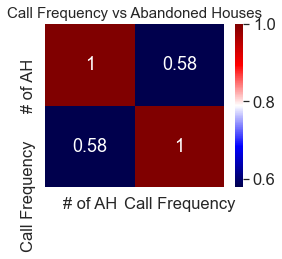

In [11]:
call_freq_corr = master_df[['Num of Abandoned Houses', 'Frequency']].corr()
call_freq_corr.columns = ['# of AH', 'Call Frequency']
call_freq_corr.index = ['# of AH', 'Call Frequency']

sns.set(rc = {'figure.figsize':(4,3)}, font_scale=1.5)
sns.heatmap(call_freq_corr, annot = True, cmap = 'seismic')
plt.title('Call Frequency vs Abandoned Houses', fontsize = 15) # title with fontsize 20

Text(0.5, 1.0, 'Crime vs Abandoned Houses')

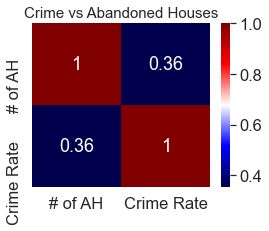

In [12]:
crime_freq_corr = master_df[['Num of Abandoned Houses', 'Crime Frequency']].corr()
crime_freq_corr.columns = ['# of AH', 'Crime Rate']
crime_freq_corr.index = ['# of AH', 'Crime Rate']
sns.set(rc = {'figure.figsize':(4, 3)}, font_scale=1.5)
sns.heatmap(crime_freq_corr, annot = True, cmap = 'seismic')
plt.title('Crime vs Abandoned Houses', fontsize = 15) # title with fontsize 20

In [599]:
master_df.columns

Index(['Animals', 'City Facilities', 'Data Not Available', 'Legal',
       'Lights/Signals/Signs', 'Maintenance', 'Neighborhood', 'Noise', 'Other',
       'Parking', 'Parks and Recreation', 'Property Violations',
       'Public Health', 'Public Safety', 'Street/Sidewalks', 'Traffic',
       'Trash', 'Vehicles', 'Water', 'Frequency', 'City Services (dept)',
       'Finance (dept)', 'Fire (dept)', 'General Service (dept)',
       'Health (dept)', 'Housing and Community Development (dept)',
       'KC Police Department (dept)', 'Municipal Court (dept)',
       'National Communications System (dept)',
       'National Honor Society (dept)', 'Other (dept)',
       'Parks and Recreation (dept)', 'Public Works (dept)',
       'Water Services (dept)', 'On time (0-day delay)', '1 day', '2 days',
       '7-day window', '14-day window', '30-day window', '60-day window',
       '90-day window', '120-day window', '180-day window', '365-day window',
       '365+ -day window', 'NBH_ID', 'Total popula

Text(0.5, 1.0, 'Socioeconomic vs Abandoned Houses')

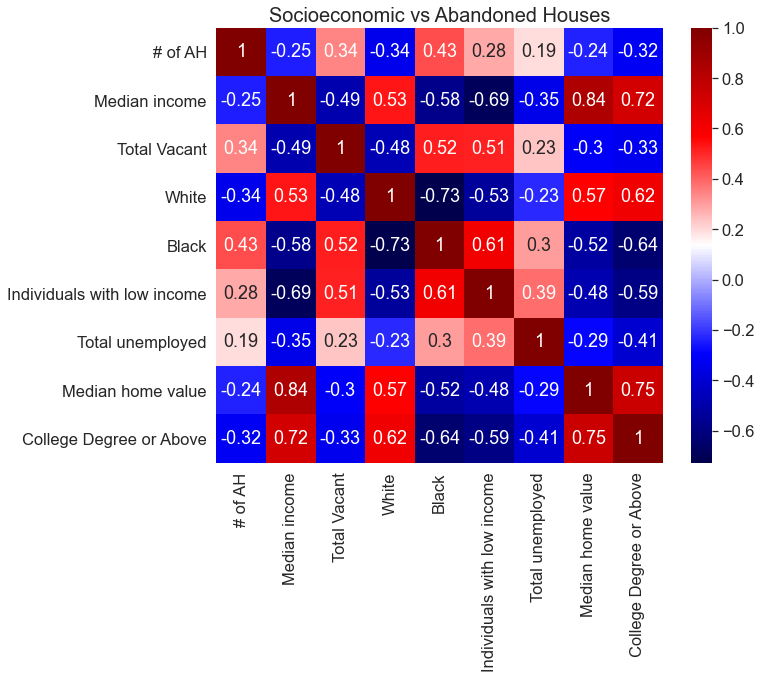

In [13]:
socio_corr = master_df[['Num of Abandoned Houses', 'Median income', 'Total Vacant', 'White alone', 'Black or African American alone', 'Individuals with income below poverty', 'Total unemployed', 'Median home value', 'Total population age 25+ years with a bachelor\'s degree or higher']].corr()
socio_corr.columns = ['# of AH', 'Median income', 'Total Vacant', 'White', 'Black', "Individuals with low income", "Total unemployed", 'Median home value', 'College Degree or Above' ]
socio_corr.index = ['# of AH', 'Median income', 'Total Vacant', 'White', 'Black', "Individuals with low income", "Total unemployed", 'Median home value', 'College Degree or Above',]

sns.set(rc = {'figure.figsize':(10,8)}, font_scale=1.5)
sns.heatmap(socio_corr, annot = True, cmap = 'seismic')
plt.title('Socioeconomic vs Abandoned Houses', fontsize = 20) # title with fontsize 20

0      0.486877
1      0.812475
2      0.623853
3      0.622967
4      0.258456
         ...   
234    0.807224
235    0.813276
236    0.684910
237    0.796875
238    0.794854
Length: 239, dtype: float64

In [571]:
socio_corr[1:2]

,# of Abandoned Houses,Median income,Total Vacant,White,Black,Individuals with low income
Median income,-0.247267,1.0,-0.48674,0.539091,-0.518971,0.215873


Text(0.5, 1.0, 'Property Violations vs Abandoned Houses')

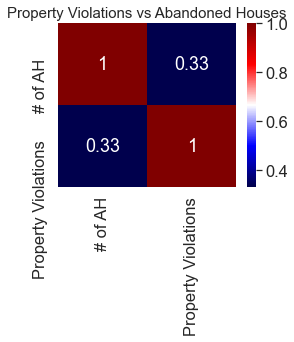

In [14]:
property_corr = master_df[['Num of Abandoned Houses', 'Property Violations']].corr()
property_corr.columns = ['# of AH', 'Property Violations']
property_corr.index = ['# of AH', 'Property Violations']
sns.set(rc = {'figure.figsize':(4,3)}, font_scale=1.5)
sns.heatmap(property_corr, annot = True, cmap = 'seismic')
plt.title('Property Violations vs Abandoned Houses', fontsize = 15) # title with fontsize 20

In [549]:
master_df[['Num of Abandoned Houses', 'Property Violations']]

,Num of Abandoned Houses,Property Violations
0,0.0,0.50000
1,0.0,0.00000
2,0.0,0.00000
3,0.0,0.08036
4,0.0,0.16667
...,...,...
234,0.0,0.15217
235,0.0,0.08571
236,0.0,0.16000
237,0.0,0.06667


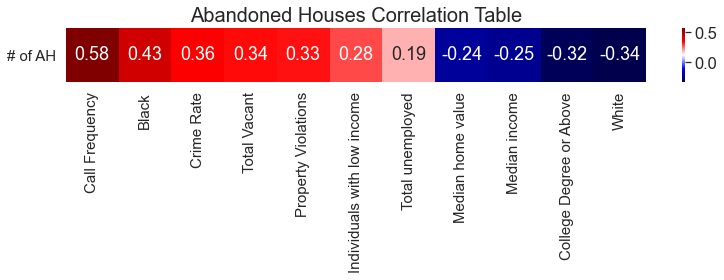

In [15]:


display_row_socio = socio_corr[0:1].loc[:,  ['Median income', 'Total Vacant', 'White', 'Black', "Individuals with low income", "Total unemployed", 'Median home value', 'College Degree or Above',]]
display_row_crime = crime_freq_corr[0:1].loc[:, ['Crime Rate']]
display_row_call = call_freq_corr[0:1].loc[:, ['Call Frequency']]
display_row_pv = property_corr[0:1].loc[:, ['Property Violations']]

display_row = pd.concat([display_row_socio, display_row_crime, display_row_call, display_row_pv], axis=1)
display_row = display_row.sort_values('# of AH', axis=1, ascending=False, inplace=False, kind='quicksort', na_position='last')
sns.set(rc = {'figure.figsize':(13,1)}, font_scale=1.5)
g= sns.heatmap(display_row, annot = True, cmap = 'seismic')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 15)
g.set_xticklabels(g.get_xticklabels(), rotation = 90, fontsize = 15)

plt.title('Abandoned Houses Correlation Table', fontsize = 20) # title with fontsize 20
fig = g.get_figure()
# fig.set_tight_layout(True)
fig.savefig('AbandonedCorrelationTable.png',  bbox_inches="tight")


In [872]:
# .savefig('AbandonedCorrelationTable.png')

<Figure size 936x72 with 0 Axes>

In [651]:
len(compared_columns)

10

In [722]:
len(display_row.columns)

11

Text(0.5, 0.98, 'Abandoned House Regression and Correlation Graphs')

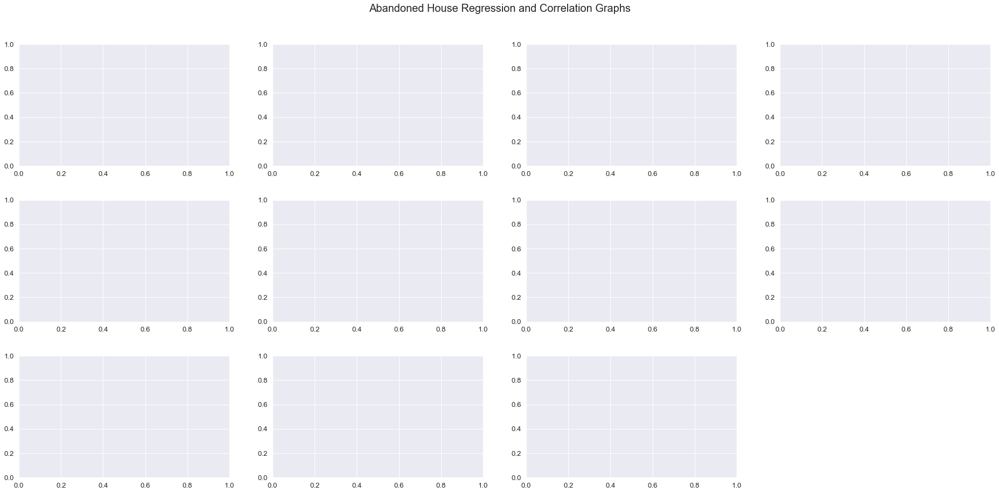

In [20]:
fig, axes = plt.subplots(3, 4)
fig.delaxes(axes[2][3])
fig.set_size_inches(26, 13)
fig.tight_layout(h_pad=3, w_pad=3)
plt.subplots_adjust(top=0.9)
fig.suptitle('Abandoned House Regression and Correlation Graphs', fontsize=20)

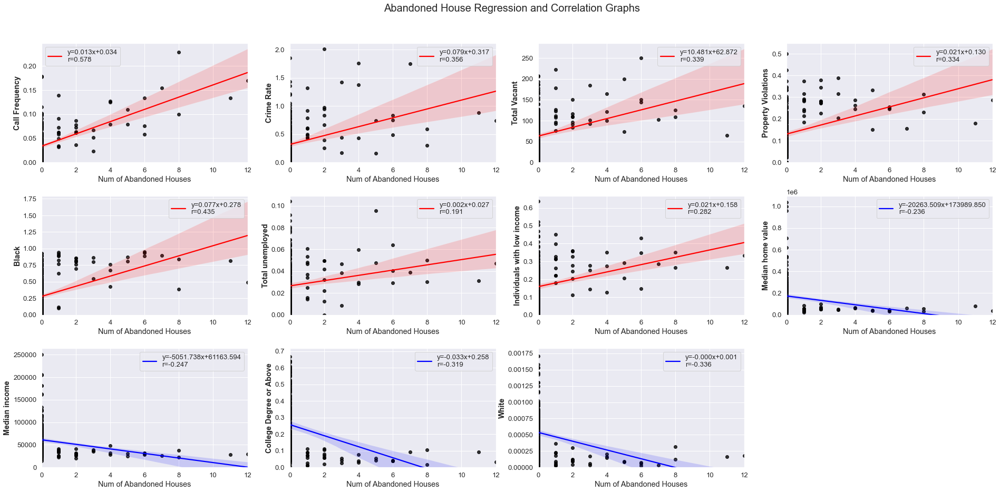

In [21]:
import seaborn as sns
from matplotlib import pyplot as plt
from scipy import stats

compared_columns = ['Frequency', 'Crime Frequency', 'Total Vacant', 'Property Violations', 'Black or African American alone' , 'Total unemployed',  "Individuals with income below poverty", 'Median home value', 'Median income', 'Total population age 25+ years with a bachelor\'s degree or higher', 'White alone']
renamed_columns = ['Call Frequency', 'Crime Rate', 'Total Vacant', 'Property Violations','Black', 'Total unemployed', 'Individuals with low income','Median home value', 'Median income', 'College Degree or Above', 'White']

for index, col in enumerate(compared_columns):
    slope, intercept, r_value, p_value, std_err = stats.linregress(master_df["Num of Abandoned Houses"],master_df[col])
    # slope, intercept, r_value, p_value, std_err = stats.linregress(master_df["Num of Abandoned Houses"],master_df["White alone"])

    # df = sb.load_dataset('tips')
    sns.set(rc = {'figure.figsize':(4,3)}, font_scale=1.2)
    correlation_value = display_row[renamed_columns[index]].values[0]
    row_index = 0
    column_index = index
    if index > 7:
        row_index = 2
        column_index = index - 8
    elif index > 3:
        row_index = 1
        column_index = index - 4
    line_color = 'red'
    if correlation_value < 0:
        line_color = 'blue'
    ax = sns.regplot(x = "Num of Abandoned Houses", y = col, data = master_df, 
                     line_kws={'label':"y={0:.3f}x+{1:.3f}\nr={2:.3f}".format(slope,intercept, correlation_value), "color": line_color}, 
                     scatter_kws={"color": "black"},
                     ax = axes[row_index][column_index])
    # ax = sns.regplot(x = "Num of Abandoned Houses", y = col, data = master_df, line_kws={'label':"y={0:.3f}x+{1:.3f}\nr={2:.3f}".format(slope,intercept, correlation_value)})
    
    # plt.ylim(0, None)
    ax.set_ylim([0, None])
    ax.set_ylabel(renamed_columns[index], fontweight ='bold')
    # plot legend
    ax.legend()
    # plt.ylim(0, 1000)
    # break
fig.savefig('AbandonedCorrelationGraph.png', bbox_inches="tight")
fig

In [638]:
display_row[renamed_columns[0]].values[0]

0.5782807191006115

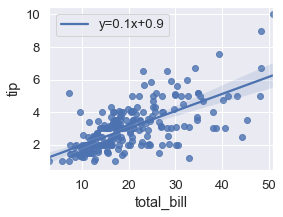

In [615]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

tips = sns.load_dataset("tips")

# get coeffs of linear fit
slope, intercept, r_value, p_value, std_err = stats.linregress(tips['total_bill'],tips['tip'])

# use line_kws to set line label for legend
ax = sns.regplot(x="total_bill", y="tip", data=tips, color='b', 
 line_kws={'label':"y={0:.1f}x+{1:.1f}".format(slope,intercept)})

# plot legend
ax.legend()

plt.show()

<h1> Create new dataset

In [2]:
df_lb_houses = pd.read_csv('landbank_bhuvan_with_nbhids.csv')
lb_nbh_df_all = pd.read_csv('landbank_count_by_nbhid.csv')
master_df = pd.read_csv('../Clustering/Socioeconomic/311_Census_master_info.csv')
lb_nbh_df_all.head()

,nbhid,category,Num of Abandoned Houses
0,4,Occupied,5
1,5,Occupied,1
2,6,Occupied,1
3,7,Occupied,1
4,9,Occupied,1


In [3]:
df_lb_houses.head()

,filename,category,file_path,Address,fov,Latitude,Longitude,nbhname,nbhid,block_id,district,division,divisionname
0,10147_N_GREEN_HILLS_RD_facing=90.jpg.Occupied.jpg,Occupied,LandBank_Data\10147_N_GREEN_HILLS_RD_facing=90...,10147 N GREEN HILLS RD,facing=90,39.278070,-94.630190,KCI & 2nd Creek,231.0,2.916503e+11,2.0,4.0,North
1,103_W_19TH_ST_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\103_W_19TH_ST_facing=60.jpg.Occu...,103 W 19TH ST,facing=60,39.090750,-94.585380,Crossroads,7.0,2.909502e+11,4.0,1.0,Central
2,106_W_14th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\106_W_14th_St_facing=60.jpg.Occu...,106 W 14th St,facing=60,39.097570,-94.584720,CBD Downtown,4.0,2.909502e+11,4.0,1.0,Central
3,1102_Agnes_Ave_facing=180.jpg.Abandoned.jpg,Abandoned,LandBank_Data\1102_Agnes_Ave_facing=180.jpg.Ab...,1102 Agnes Ave,facing=180,39.100312,-94.547036,Independence Plaza,16.0,2.909500e+11,4.0,3.0,East
4,1116_E_44th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\1116_E_44th_St_facing=60.jpg.Occ...,1116 E 44th St,facing=60,39.047430,-94.571810,Manheim Park,69.0,2.909501e+11,3.0,1.0,Central


In [4]:
master_df = lb_nbh_df_all.merge(master_df, how='inner', left_on='nbhid', right_on='NBH_ID').drop(columns=['NBH_ID'])
master_df.head()

,nbhid,category,Num of Abandoned Houses,Animals,City Facilities,Data Not Available,Legal,Lights/Signals/Signs,Maintenance,Neighborhood,...,No schooling completed,High school diploma,Bachelor's degree,Master's degree,Doctorate degree,NBH_NAME,EQUIVALENT_BLOCKGROUPS,Total Calls,Crime Frequency,Boundaries
0,4,Occupied,5,0.08929,0.02679,0.0,0.01786,0.08929,0.00893,0.0,...,3.0,5.0,482.0,242.0,58.0,CBD Downtown,"['290950157002', '290950159001', '290950157001']",112.0,0.375239,"[[-94.57231978141229, 39.10627878158096], [-94..."
1,5,Occupied,1,0.05556,0.00000,0.0,0.00000,0.00000,0.00000,0.0,...,49.0,0.0,108.0,40.0,7.0,Paseo West,"['290950154001', '290950154002', '290950159001']",18.0,0.906287,"[[-94.56368874393506, 39.105292460875276], [-9..."
2,6,Occupied,1,0.04762,0.00000,0.0,0.00000,0.23810,0.00000,0.0,...,17.0,9.0,213.0,97.0,12.0,Hospital Hill,"['290950158002', '290950158001', '290950043001']",21.0,0.887199,"[[-94.56999826213176, 39.09614182331412], [-94..."
3,7,Occupied,1,0.00000,0.00000,0.0,0.00000,0.07143,0.03571,0.0,...,3.0,2.0,263.0,113.0,18.0,Crossroads,"['290950158002', '290950158001']",28.0,0.392749,"[[-94.57873313633799, 39.09595835924877], [-94..."
4,9,Occupied,1,0.07273,0.00000,0.0,0.00000,0.03636,0.05454,0.0,...,6.0,19.0,175.0,99.0,11.0,Westside South,"['290950153001', '290950044001', '290950153002...",55.0,0.598194,"[[-94.58977185013445, 39.08568066411284], [-94..."


In [8]:
df_lb_houses_with_socio = df_lb_houses.merge(master_df, how='inner', left_on='nbhid', right_on='nbhid')

In [10]:
df_lb_houses_with_socio.head()

,filename,category_x,file_path,Address,fov,Latitude,Longitude,nbhname,nbhid,block_id,...,No schooling completed,High school diploma,Bachelor's degree,Master's degree,Doctorate degree,NBH_NAME,EQUIVALENT_BLOCKGROUPS,Total Calls,Crime Frequency,Boundaries
0,10147_N_GREEN_HILLS_RD_facing=90.jpg.Occupied.jpg,Occupied,LandBank_Data\10147_N_GREEN_HILLS_RD_facing=90...,10147 N GREEN HILLS RD,facing=90,39.27807,-94.63019,KCI & 2nd Creek,231.0,2.916503e+11,...,2.0,12.0,445.0,191.0,33.0,KCI & 2nd Creek,"['291650302011', '291650303082', '291650306001...",84.0,0.118994,"[[-94.67554161905578, 39.35488862673933], [-94..."
1,103_W_19TH_ST_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\103_W_19TH_ST_facing=60.jpg.Occu...,103 W 19TH ST,facing=60,39.09075,-94.58538,Crossroads,7.0,2.909502e+11,...,3.0,2.0,263.0,113.0,18.0,Crossroads,"['290950158002', '290950158001']",28.0,0.392749,"[[-94.57873313633799, 39.09595835924877], [-94..."
2,106_W_14th_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\106_W_14th_St_facing=60.jpg.Occu...,106 W 14th St,facing=60,39.09757,-94.58472,CBD Downtown,4.0,2.909502e+11,...,3.0,5.0,482.0,242.0,58.0,CBD Downtown,"['290950157002', '290950159001', '290950157001']",112.0,0.375239,"[[-94.57231978141229, 39.10627878158096], [-94..."
3,1319_Wyandotte_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\1319_Wyandotte_St_facing=60.jpg....,1319 Wyandotte St,facing=60,39.09797,-94.58533,CBD Downtown,4.0,2.909502e+11,...,3.0,5.0,482.0,242.0,58.0,CBD Downtown,"['290950157002', '290950159001', '290950157001']",112.0,0.375239,"[[-94.57231978141229, 39.10627878158096], [-94..."
4,815_Cherry_St_facing=60.jpg.Occupied.jpg,Occupied,LandBank_Data\815_Cherry_St_facing=60.jpg.Occu...,815 Cherry St,facing=60,39.10375,-94.57575,CBD Downtown,4.0,2.909502e+11,...,3.0,5.0,482.0,242.0,58.0,CBD Downtown,"['290950157002', '290950159001', '290950157001']",112.0,0.375239,"[[-94.57231978141229, 39.10627878158096], [-94..."


In [211]:
master_df.to_csv("311_Census_LB_master_info.csv", index = False)

In [11]:
df_lb_houses_with_socio.to_csv("LB_houses_with_socioeconomic.csv", index = False)

<h1> Clustering

<h2> Clustering with Population

In [107]:
df_lb_houses = pd.read_csv('landbank_bhuvan_with_nbhids.csv')
lb_nbh_df = pd.read_csv('landbank_abandoned_count_by_nbhid.csv')
master_df = pd.read_csv('../Clustering/Socioeconomic/311_Census_master_info.csv')
master_df['Black or African American alone'] = master_df['Black or African American alone']/master_df['Total population']
master_df['White alone'] = master_df['White alone']/master_df['Total population']
master_df['Total population age 25+ years with a bachelor\'s degree or higher'] = master_df['Total population age 25+ years with a bachelor\'s degree or higher']/master_df['Total population']
master_df['Total unemployed'] = master_df['Total unemployed']/master_df['Total civilian labor force']
master_df['Individuals with income below poverty'] = master_df['Individuals with income below poverty']/master_df['Total population']
master_df['NBH_ID'] = master_df['NBH_ID'].astype(int)
master_df = master_df.merge(lb_nbh_df, how='left', left_on='NBH_ID', right_on='nbhid').drop(columns=['nbhid']).drop_duplicates().fillna(0)
master_df.shape
nbh_ids = master_df['NBH_ID'].unique().tolist()

In [109]:
merged_df = master_df.copy()
merged_df.shape

(239, 79)

In [93]:
merged_df[merged_df['NBH_NAME'] == 'Ivanhoe Northeast'][['White alone', 'Black or African American alone']]

,White alone,Black or African American alone
54,0.022825,0.8602


In [94]:
'''
Added Clusters to NBH Boundaries JSON
''' 
import copy
# dict2 = copy.deepcopy(dict1)
with open('../311/Kansas City Neighborhood Boundaries.geojson') as f:
    nbh_boundaries = json.loads(f.read())

In [110]:
'''
Clustering by Population
'''
# !rm -rf exports
# !mkdir 'exports/'
# !mkdir 'exports/KMeans'
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

import numpy as np
from tqdm.notebook import tqdm
import json
import matplotlib.pyplot as plt
sc = StandardScaler()

for i in tqdm(range(5,6)):
    '''
    Cluster by Population
    '''
    df = merged_df.loc[:,['White alone', 'Black or African American alone', 'Num of Abandoned Houses']]
    X = np.nan_to_num(df.values)
    cluster_data = sc.fit_transform(X)
    # print(cluster_data[:5])
    kmeans = KMeans(n_clusters=i, random_state=0).fit(cluster_data)
    # kmeans.labels_
    master_df['cluster_by_population'] = kmeans.labels_ + 1
    
    '''
    Cluster by Crime
    '''
    df = merged_df.loc[:,['Crime Frequency', 'Num of Abandoned Houses']]
    X = np.nan_to_num(df.values)
    cluster_data = sc.fit_transform(X)
    # print(cluster_data[:5])
    kmeans = KMeans(n_clusters=i, random_state=0).fit(cluster_data)
    # kmeans.labels_
    master_df['cluster_by_crime'] = kmeans.labels_ + 1
    
    '''
    Cluster by Property Violations
    '''
    df = merged_df.loc[:,['Property Violations', 'Num of Abandoned Houses']]
    X = np.nan_to_num(df.values)
    cluster_data = sc.fit_transform(X)
    # print(cluster_data[:5])
    kmeans = KMeans(n_clusters=i, random_state=0).fit(cluster_data)
    # kmeans.labels_
    master_df['cluster_by_property_violations'] = kmeans.labels_ + 1
    
    '''
    Cluster by Call Frequency
    '''
    df = merged_df.loc[:,['Frequency', 'Num of Abandoned Houses']]
    X = np.nan_to_num(df.values)
    cluster_data = sc.fit_transform(X)
    # print(cluster_data[:5])
    kmeans = KMeans(n_clusters=i, random_state=0).fit(cluster_data)
    # kmeans.labels_
    master_df['cluster_by_call_frequency'] = kmeans.labels_ + 1
    
    '''
    Cluster by Socioeconomic
    '''
    df = merged_df.loc[:,['Median income', 'Median home value', 'Total unemployed', 'Total population age 25+ years with a bachelor\'s degree or higher', 
                          'Individuals with income below poverty', 'Num of Abandoned Houses']]
    X = np.nan_to_num(df.values)
    cluster_data = sc.fit_transform(X)
    # print(cluster_data[:5])
    kmeans = KMeans(n_clusters=i, random_state=0).fit(cluster_data)
    # kmeans.labels_
    master_df['cluster_by_socioeconomic'] = kmeans.labels_ + 1
    
    '''
    Cluster by DemoSocioeconomic
    '''
    df = merged_df.loc[:,['White alone', 'Black or African American alone', 'Median income', 'Median home value', 'Total unemployed', 'Total population age 25+ years with a bachelor\'s degree or higher', 
                          'Individuals with income below poverty', 'Num of Abandoned Houses']]
    X = np.nan_to_num(df.values)
    cluster_data = sc.fit_transform(X)
    # print(cluster_data[:5])
    kmeans = KMeans(n_clusters=i, random_state=0).fit(cluster_data)
    # kmeans.labels_
    master_df['cluster_by_demosocioeconomic'] = kmeans.labels_ + 1
    
    '''
    Write to JSON and CSV
    '''
    master_df.to_csv('Clustering/exports/KMeans/246NBH-{}clusters-KMeans.csv'.format(str(i)), index = False)
    with open('Clustering/exports/KMeans/246NBH-{}clusters-KMeans.json'.format(i), 'w') as f:
        bg_dict = master_df.to_dict('index')
        bg_dict['Cluster_Total'] = i
        f.write(json.dumps(bg_dict))
    new_json = copy.deepcopy(nbh_boundaries)
    for j, item in enumerate(new_json['features']):
        nbh_id = int(item['properties']['nbhid'])
        if nbh_id in nbh_ids:
            # if int(master_df[master_df['NBH_ID'] == nbh_id]['cluster_by_call_frequency'].values[0]) == 5:
            #     print("YES!")
            # print(j)
            item['properties']['abandoned_num'] = int(master_df[master_df['NBH_ID'] == nbh_id]['Num of Abandoned Houses'].values[0])
            
            item['properties']['cluster_by_population'] = int(master_df[master_df['NBH_ID'] == nbh_id]['cluster_by_population'].values[0])
            item['properties']['white_population'] = master_df[master_df['NBH_ID'] == nbh_id]['White alone'].values[0]
            item['properties']['black_population'] = master_df[master_df['NBH_ID'] == nbh_id]['Black or African American alone'].values[0]
            
            item['properties']['cluster_by_crime'] = int(master_df[master_df['NBH_ID'] == nbh_id]['cluster_by_crime'].values[0])
            item['properties']['crime_frequency'] = master_df[master_df['NBH_ID'] == nbh_id]['Crime Frequency'].values[0]
            
            item['properties']['cluster_by_property_violations'] = int(master_df[master_df['NBH_ID'] == nbh_id]['cluster_by_property_violations'].values[0])
            item['properties']['property_violations'] = master_df[master_df['NBH_ID'] == nbh_id]['Property Violations'].values[0]
            
            item['properties']['cluster_by_call_frequency'] = int(master_df[master_df['NBH_ID'] == nbh_id]['cluster_by_call_frequency'].values[0])
            item['properties']['call_frequency'] = master_df[master_df['NBH_ID'] == nbh_id]['Total Calls'].values[0]
            
            item['properties']['cluster_by_socioeconomic'] = int(master_df[master_df['NBH_ID'] == nbh_id]['cluster_by_socioeconomic'].values[0])
            item['properties']['median_income'] = master_df[master_df['NBH_ID'] == nbh_id]['Median income'].values[0]
            item['properties']['median_home_value'] = master_df[master_df['NBH_ID'] == nbh_id]['Median home value'].values[0]
            item['properties']['total_unemployed'] = master_df[master_df['NBH_ID'] == nbh_id]['Total unemployed'].values[0]
            item['properties']['total_with_bachelors'] = master_df[master_df['NBH_ID'] == nbh_id]['Total population age 25+ years with a bachelor\'s degree or higher'].values[0]
            item['properties']['total_poverty'] = master_df[master_df['NBH_ID'] == nbh_id]['Individuals with income below poverty'].values[0]
            
            item['properties']['cluster_by_demosocioeconomic'] = int(master_df[master_df['NBH_ID'] == nbh_id]['cluster_by_demosocioeconomic'].values[0])
            
        else:
            item['properties']['abandoned_num'] = "N/A"
            
            item['properties']['cluster_by_population'] = 0
            item['properties']['white_population'] = "N/A"
            item['properties']['black_population'] = "N/A"
            
            item['properties']['cluster_by_crime'] = 0
            item['properties']['crime_frequency'] = "N/A"
            
            item['properties']['cluster_by_property_violations'] = 0
            item['properties']['property_violations'] = "N/A"
            
            item['properties']['cluster_by_call_frequency'] = 0
            item['properties']['call_frequency'] = "N/A"
            
            item['properties']['cluster_by_socioeconomic'] = 0
            item['properties']['median_income'] = "N/A"
            item['properties']['median_home_value'] = "N/A"
            item['properties']['total_unemployed'] = "N/A"
            item['properties']['total_with_bachelors'] = "N/A"
            item['properties']['total_poverty'] = "N/A"
            item['properties']['cluster_by_demosocioeconomic'] = 0
            
            
            # item['properties']['Cluster by Population'] = int(item['properties']['Cluster by Population'])
    with open('Clustering/exports/KMeans/246NBH-{}clusters-KMeans.geojson'.format(i), 'w') as f:
        f.write(json.dumps(new_json))
        f.close()
    # break
    
    
    
# master_df[['NBH_ID', 'White alone', 'Black or African American alone', 'Num of Abandoned Houses', 'cluster_by_population']].drop_duplicates().head()
master_df[['NBH_ID', 'Crime Frequency', 'cluster_by_crime']].drop_duplicates().head()



  0%|          | 0/1 [00:00<?, ?it/s]

,NBH_ID,Crime Frequency,cluster_by_crime
0,1,0.205231,5
1,2,0.408257,1
2,3,1.355183,3
3,4,0.375239,1
4,5,0.906287,3


In [96]:
master_df[['NBH_ID', 'White alone', 'Black or African American alone', 'cluster_by_demosocioeconomic']].drop_duplicates().head()


,NBH_ID,White alone,Black or African American alone,cluster_by_demosocioeconomic
0,1,0.486877,0.329396,2
1,2,0.812475,0.080885,5
2,3,0.623853,0.232798,1
3,4,0.622967,0.243394,5
4,5,0.258456,0.523931,2


In [97]:
new_json['features'][10]['properties']

{'shape_area': '44763617.9393',
 'nbhname': 'Eastwood Hills East',
 'objectid': '69',
 'nbhid': '43',
 'shape_len': '28967.0447297',
 'abandoned_num': 0,
 'cluster_by_population': 5,
 'white_population': 0.4327233584499462,
 'black_population': 0.39289558665231433,
 'cluster_by_crime': 5,
 'crime_frequency': 0.08583690987124462,
 'cluster_by_property_violations': 1,
 'property_violations': 0.12766,
 'cluster_by_call_frequency': 5,
 'call_frequency': 94.0,
 'cluster_by_socioeconomic': 1,
 'median_income': 47784.0,
 'median_home_value': 85875.0,
 'total_unemployed': 0.02906350914962325,
 'total_with_bachelors': 0.08719052744886975,
 'total_poverty': 0.20129171151776104,
 'cluster_by_demosocioeconomic': 1}

In [98]:
'''
NBH Boundaries with Clusters
'''
cluster_total = 5
with open(f'Clustering/exports/KMeans/246NBH-{str(cluster_total)}clusters-KMeans.geojson') as f:
    nbh_json_clustered = f.read()
nbh_csv_clustered = pd.read_csv(f'Clustering/exports/KMeans/246NBH-{str(cluster_total)}clusters-KMeans.csv')
custom_pallete = (
    '#7f7f7f',
 '#e377c2',
'#8c564b',
'#ff7f0e',
'#80cde0',
'#9467bd',
'#bcbd22',)

In [29]:
nbh_csv_clustered['cluster_by_call_frequency'].unique()

array([2, 5, 3, 1, 4], dtype=int64)

In [507]:
temp_set = []
for x in json.loads(nbh_json_clustered)['features']:
    cluster_id = x['properties']['cluster_by_call_frequency']
    # print(cluster_id)
    temp_set.append(cluster_id)
temp_set = set(temp_set)
temp_set

{0, 1, 2, 3, 4, 5}

In [51]:
master_df['White alone']

0      0.000319
1      0.000327
2      0.000715
3      0.000317
4      0.000165
         ...   
234    0.000317
235    0.000348
236    0.000350
237    0.000655
238    0.000553
Name: White alone, Length: 239, dtype: float64

In [101]:
# <!-- collapse=True -->
# gjds = bokeh.models.GeoJSONDataSource(geojson=bg_geo_df.to_json())
# gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json)
gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json_clustered)


color_map = {
    "Abandoned": 'red',
    'Occupied': '#1fcc36'
}

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(title="246 KCMO Neighborhoods with Bhuvan's Data", tools=TOOLS, plot_width = 400, x_range=(-94.8, -94.3), y_range=(38.8, 39.4), x_axis_location = None, y_axis_location = None)
# p = bokeh.plotting.figure(title="462 Block Groups", tools=TOOLS)
color_mapper = bokeh.models.LinearColorMapper(palette=custom_pallete)

p.patches('xs', 'ys', 
          fill_color={'field': 'cluster_by_population', 'transform': color_mapper},
          # fill_color = 'lightgray',
          fill_alpha=1., line_color="black", line_width=0.5,          
          source=gjds)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
    <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    <div class="bokeh_hover_tooltip">White Population : @white_population{1.111}</div>
    <div class="bokeh_hover_tooltip">Black Population : @black_population</div>
    <div class="bokeh_hover_tooltip">Abandoned Houses : @abandoned_num</div>
    
</div>

"""
# hover.tooltips = u"""
# <div> 
#     <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
#     <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    
#     <div class="bokeh_hover_tooltip">(Lon, Lat) : ($x ˚E, $y ˚N)</div>
# </div>

# """

for x in df_lb['category'].unique().tolist():
    source = ColumnDataSource(data={
                'lat': coords_df[coords_df['category'] == x].Latitude.tolist(), # python datetime object as X axis
                'lng': coords_df[coords_df['category'] == x].Longitude.tolist(),
                'nbhname': coords_df[coords_df['category'] == x].nbhname.tolist(), #string of datetime for display in tooltip
            })
    # print({
    #             'lat': coords_df[coords_df['Type'] == x].lng.tolist(), # python datetime object as X axis
    #             'lng': coords_df[coords_df['Type'] == x].lng.tolist(),
    #             'nbhname': coords_df[coords_df['Type'] == x].nbhname.tolist(), #string of datetime for display in tooltip
    #         })
    p.circle('lng',  'lat', size=5, fill_color=color_map[x], line_color=color_map[x], line_width=1, alpha=1.0, legend_label = x, source = source)
    
# p.circle(coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, size=4, fill_color='red', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Crime')
# p.circle(coords_df[coords_df['Type'] == 'Property Violation Calls'].lng, coords_df[coords_df['Type'] == 'Property Violation Calls'].lat, size=4, fill_color='orange', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Calls')
# p.circle(coords_df[coords_df['Type'] == 'LB Locations'].lng, coords_df[coords_df['Type'] == 'LB Locations'].lat, size=10, fill_color='green', line_color='yellow', line_width=1, alpha=1.0, legend_label='LB Locations')
from bokeh.models import GlyphRenderer, Circle
grs = p.select(dict(type=GlyphRenderer))
for glyph in grs:
    if isinstance(glyph.glyph, Circle) == False:
        circle_renderer = glyph
hover.renderers = [circle_renderer]
# p.legend.location = "bottom_right"
p.legend.click_policy="hide"


show(p)

In [511]:
# <!-- collapse=True -->
# gjds = bokeh.models.GeoJSONDataSource(geojson=bg_geo_df.to_json())
# gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json)
gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json_clustered)

source_json = json.loads(nbh_json_clustered)
color_map = {
    "Abandoned": 'red',
    'Occupied': '#1fcc36'
}

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(title="Cluster with Population", tools=TOOLS, plot_width = 400, x_range=(-94.8, -94.3), y_range=(38.8, 39.4), x_axis_location = None, y_axis_location = None)
# p = bokeh.plotting.figure(title="462 Block Groups", tools=TOOLS)
color_mapper = bokeh.models.LinearColorMapper(palette=custom_pallete)
source_shapes = {}
for cluster_id in range(0, cluster_total+1):
    source_shapes[cluster_id] = {"type": "FeatureCollection", "features": []}
for item in source_json['features']:
    if 'cluster_by_population' in item['properties']: 
        source_shapes[item['properties']['cluster_by_population']]['features'].append(item)
    else:
        source_shapes[0]['features'].append(item)
        

for cluster_id in range(0, cluster_total+1):    
    source_shape = GeoJSONDataSource(geojson = json.dumps(source_shapes[cluster_id]))
    label = "Cluster " + str(cluster_id) if cluster_id > 0 else "No Cluster"
    p.patches('xs', 'ys', 
            # fill_color={'field': 'cluster_by_population', 'transform': color_mapper},
            fill_color = custom_pallete[cluster_id],
            fill_alpha=1., line_color="black", line_width=0.5,          
            source=source_shape,
            legend_label = label)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
    <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    <div class="bokeh_hover_tooltip">White Population : @white_population</div>
    <div class="bokeh_hover_tooltip">Black Population : @black_population</div>
    <div class="bokeh_hover_tooltip">Abandoned Houses : @abandoned_num</div>
</div>

"""
# hover.tooltips = u"""
# <div> 
#     <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
#     <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    
#     <div class="bokeh_hover_tooltip">(Lon, Lat) : ($x ˚E, $y ˚N)</div>
# </div>

# """


for x in df_lb['category'].unique().tolist():
    source = ColumnDataSource(data={
                'lat': coords_df[coords_df['category'] == x].Latitude.tolist(), # python datetime object as X axis
                'lng': coords_df[coords_df['category'] == x].Longitude.tolist(),
                'nbhname': coords_df[coords_df['category'] == x].nbhname.tolist(), #string of datetime for display in tooltip
            })
    # print({
    #             'lat': coords_df[coords_df['Type'] == x].lng.tolist(), # python datetime object as X axis
    #             'lng': coords_df[coords_df['Type'] == x].lng.tolist(),
    #             'nbhname': coords_df[coords_df['Type'] == x].nbhname.tolist(), #string of datetime for display in tooltip
    #         })
    p.circle('lng',  'lat', size=5, fill_color=color_map[x], line_color=color_map[x], line_width=1, alpha=1.0, legend_label = x, source = source)
    
# p.circle(coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, size=4, fill_color='red', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Crime')
# p.circle(coords_df[coords_df['Type'] == 'Property Violation Calls'].lng, coords_df[coords_df['Type'] == 'Property Violation Calls'].lat, size=4, fill_color='orange', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Calls')
# p.circle(coords_df[coords_df['Type'] == 'LB Locations'].lng, coords_df[coords_df['Type'] == 'LB Locations'].lat, size=10, fill_color='green', line_color='yellow', line_width=1, alpha=1.0, legend_label='LB Locations')

# p.legend.location = "bottom_right"
p.legend.click_policy="hide"

grs = p.select(dict(type=GlyphRenderer))
renderers = []
for glyph in grs:
    if isinstance(glyph.glyph, Circle) == False:
        renderers.append(glyph)
hover.renderers = renderers
show(p)

In [510]:
source_shapes.keys()

dict_keys(['N/A', 0, 1, 2, 3, 4])

In [426]:
master_df[master_df['NBH_NAME'] == 'Shoal Creek']

,Animals,City Facilities,Data Not Available,Legal,Lights/Signals/Signs,Maintenance,Neighborhood,Noise,Other,Parking,...,Total Calls,Crime Frequency,Boundaries,Num of Abandoned Houses,Cluster by Population,cluster_by_population,cluster_by_crime,cluster_by_property_violations,cluster_by_call_frequency,cluster_by_socioeconomic


<h2> Clustering with Crime Frequency

In [30]:
import pandas as pd
crime_df = pd.read_csv('../Crime/CrimeData2020-withlocality.csv')
crime_df.head()

,Address,Age,Area,Beat,City,DVFlag,Description,Firearm Used Flag,Formatted Address,From_Date,...,To_Date,To_Time,Zip Code,blockgroup_id,lat,lng,nbh_name,nbhid,police_division,police_division_id
0,3800 AGNES AVE,22.0,EPD,333,KANSAS CITY,N,Robbery,1.0,"3800 Agnes Ave, Kansas City, MO 64128, USA",01/01/2020,...,NaN,NaN,64128.0,2.909501e+11,39.056963,-94.549126,Oak Park Northwest,58,East,3.0
1,200 NICHOLS RD,NaN,CPD,134,KANSAS CITY,N,Shoplifting,0.0,"200 Nichols Rd, Kansas City, MO 64112, USA",12/30/2019,...,12/30/2019,18:00,64112.0,2.909501e+11,39.041515,-94.589762,Country Club Plaza,85,Central,1.0
2,800 NE WINDROSE CT,50.0,SCP,642,KANSAS CITY,Y,Aggravated Assault,0.0,"800 NE Windrose Ct, Kansas City, MO 64155, USA",01/03/2020,...,NaN,NaN,64155.0,2.904702e+11,39.259149,-94.570858,Gashland,236,Shoal Creek,6.0
3,1800 E 79 ST,21.0,MPD,242,KANSAS CITY,N,All Other Larceny,0.0,"1800 E 79th St, Kansas City, MO 64131, USA",01/05/2020,...,NaN,NaN,64131.0,2.909501e+11,38.984189,-94.567016,East Meyer 6,128,Metro,2.0
4,1600 E 40TH ST,26.0,CPD,142,KANSAS CITY,N,Robbery,1.0,"1600 E 40th St, Kansas City, MO 64110, USA",01/06/2020,...,NaN,NaN,64110.0,2.909502e+11,39.054227,-94.565100,Ivanhoe Southwest,53,Central,1.0


In [307]:
crime_df.Offense.unique()

array(['Robbery (Residential)', 'Stealing – Shoplift',
       'Domestic Violence Assault (Aggravated)', 'Stealing – Other',
       'Robbery (Armed Street)', 'Loss', 'Stolen Auto', 'Property Damage',
       'Possession/Sale/Distribution of a Controlled Substance',
       'Robbery (Business)', 'Rape',
       'Domestic Violence Assault (Non-Aggravated)',
       'Burglary (Residential)', 'Dead Body', 'Murder',
       'Recovered Property', 'Assault (Aggravated)', 'Forgery',
       'Sexual Misconduct', 'Abuse of a Child',
       'Assault (Non-Aggravated)', 'Recovered Stolen Auto',
       'Child Custody Violation', 'Unfounded', 'Stealing – Pickpocket',
       'Suicide – Attempted', 'Enticement of a Minor',
       'Miscellaneous Investigation', 'Vehicular – Injury',
       'Possession of Stolen Property', 'Burning or Exploding',
       'Trespass of Real Property', 'Disorderly Conduct', 'Casualty',
       'Identity Theft', 'Arson',
       'Fraud / Stealing Through Deceit (Scam/Confidence Game)'

In [284]:
merged_df.columns

Index(['Animals', 'City Facilities', 'Data Not Available', 'Legal',
       'Lights/Signals/Signs', 'Maintenance', 'Neighborhood', 'Noise', 'Other',
       'Parking', 'Parks and Recreation', 'Property Violations',
       'Public Health', 'Public Safety', 'Street/Sidewalks', 'Traffic',
       'Trash', 'Vehicles', 'Water', 'Frequency', 'City Services (dept)',
       'Finance (dept)', 'Fire (dept)', 'General Service (dept)',
       'Health (dept)', 'Housing and Community Development (dept)',
       'KC Police Department (dept)', 'Municipal Court (dept)',
       'National Communications System (dept)',
       'National Honor Society (dept)', 'Other (dept)',
       'Parks and Recreation (dept)', 'Public Works (dept)',
       'Water Services (dept)', 'On time (0-day delay)', '1 day', '2 days',
       '7-day window', '14-day window', '30-day window', '60-day window',
       '90-day window', '120-day window', '180-day window', '365-day window',
       '365+ -day window', 'NBH_ID', 'Total popula

In [31]:
# <!-- collapse=True -->
# gjds = bokeh.models.GeoJSONDataSource(geojson=bg_geo_df.to_json())
# gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json)
gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json_clustered)

source_json = json.loads(nbh_json_clustered)
color_map = {
    "Abandoned": 'red',
    'Occupied': '#1fcc36',
    'Property Violations': 'purple',
    'Crime': 'black'
}

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(title="Cluster with Crime Frequency", tools=TOOLS, plot_width = 400, x_range=(-94.8, -94.3), y_range=(38.8, 39.4), x_axis_location = None, y_axis_location = None)
# p = bokeh.plotting.figure(title="462 Block Groups", tools=TOOLS)
color_mapper = bokeh.models.LinearColorMapper(palette=custom_pallete)
source_shapes = {}
for cluster_id in range(cluster_total+1):
    source_shapes[cluster_id] = {"type": "FeatureCollection", "features": []}
for item in source_json['features']:
    if 'cluster_by_crime' in item['properties']: 
        source_shapes[item['properties']['cluster_by_crime']]['features'].append(item)
    else:
        source_shapes[0]['features'].append(item)
        

for cluster_id in range(cluster_total+1):    
    source_shape = GeoJSONDataSource(geojson = json.dumps(source_shapes[cluster_id]))
    label = "Cluster " + str(cluster_id) if cluster_id > 0 else "No Cluster"
    p.patches('xs', 'ys', 
            # fill_color={'field': 'cluster_by_population', 'transform': color_mapper},
            fill_color = custom_pallete[cluster_id],
            fill_alpha=1., line_color="black", line_width=0.5,          
            source=source_shape,
            legend_label = label)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
    <div class="bokeh_hover_tooltip">Cluster : @cluster_by_crime</div>
    <div class="bokeh_hover_tooltip">Crime Frequency : @crime_frequency</div>
    <div class="bokeh_hover_tooltip">Abandoned Houses : @abandoned_num</div>
    
</div>

"""
# hover.tooltips = u"""
# <div> 
#     <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
#     <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    
#     <div class="bokeh_hover_tooltip">(Lon, Lat) : ($x ˚E, $y ˚N)</div>
# </div>

# """
crime_source = ColumnDataSource(data={
                'lat': crime_df.lat.tolist(), # python datetime object as X axis
                'lng': crime_df.lng.tolist(),
                'address': crime_df['Address'].tolist(), #string of datetime for display in tooltip
                })
p.circle('lng',  'lat', size=5, fill_color=color_map['Crime'], line_color=color_map['Crime'], line_width=1, alpha=1.0, legend_label = "Crime Location", source = crime_source)

for x in df_lb['category'].unique().tolist():
    source = ColumnDataSource(data={
                'lat': coords_df[coords_df['category'] == x].Latitude.tolist(), # python datetime object as X axis
                'lng': coords_df[coords_df['category'] == x].Longitude.tolist(),
                'nbhname': coords_df[coords_df['category'] == x].nbhname.tolist(), #string of datetime for display in tooltip
            })
    # print({
    #             'lat': coords_df[coords_df['Type'] == x].lng.tolist(), # python datetime object as X axis
    #             'lng': coords_df[coords_df['Type'] == x].lng.tolist(),
    #             'nbhname': coords_df[coords_df['Type'] == x].nbhname.tolist(), #string of datetime for display in tooltip
    #         })
    p.circle('lng',  'lat', size=5, fill_color=color_map[x], line_color=color_map[x], line_width=1, alpha=1.0, legend_label = x, source = source)



# p.circle(coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, size=4, fill_color='red', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Crime')
# p.circle(coords_df[coords_df['Type'] == 'Property Violation Calls'].lng, coords_df[coords_df['Type'] == 'Property Violation Calls'].lat, size=4, fill_color='orange', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Calls')
# p.circle(coords_df[coords_df['Type'] == 'LB Locations'].lng, coords_df[coords_df['Type'] == 'LB Locations'].lat, size=10, fill_color='green', line_color='yellow', line_width=1, alpha=1.0, legend_label='LB Locations')

# p.legend.location = "bottom_right"
p.legend.click_policy="hide"

grs = p.select(dict(type=GlyphRenderer))
renderers = []
for glyph in grs:
    if isinstance(glyph.glyph, Circle) == False:
        renderers.append(glyph)
hover.renderers = renderers
show(p)

<h2> Cluster by Property Violations

In [32]:
import pandas as pd
df_311 = pd.read_csv('../data/raw/Merged-311_Calls_2007-2020-1497400.csv')
display(df_311.head())
socio_df = pd.read_csv('../data/raw/240NBH_socioeconomic_withshapes.csv')
display(socio_df.head())

,CASE ID,SOURCE,DEPARTMENT,WORK GROUP,REQUEST TYPE,CATEGORY,TYPE,DETAIL,CREATION DATE,CREATION TIME,...,COUNCIL DISTRICT,POLICE DISTRICT,PARCEL ID NO,LATITUDE,LONGITUDE,CASE URL,30-60-90 Days Open Window,nbh_id,nbh_name,BLOCKGROUP ID
0,2019207923,WEB,Public Works,Public Works-Street and Traffic-District 1,Streets / Roadways / Alleys-Crack-District 1,Streets / Roadways / Alleys,Crack,District 1,12/22/2019,07:56 PM,...,2.0,Shoal Creek,103703,39.281960,-94.564453,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,235,New Mark,2.904702e+11
1,2020054721,WEB,Parks and Rec,Parks and Rec-Central Region-,Parks & Recreation-Park Maintenance-Central,Parks & Recreation,Park Maintenance,Central,04/18/2020,05:10 PM,...,4.0,Central,128568,39.074934,-94.591904,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,9,Westside South,2.909500e+11
2,2019182182,PHONE,NHS,NHS-Dangerous Buildings-,Prop/Build/Construct-Dangerous Building-On list,Property / Buildings / Construction,Dangerous Building,Standard,10/21/2019,10:29 AM,...,4.0,Central,133291,39.052983,-94.577808,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,78,South Hyde Park,2.909501e+11
3,2020149407,PHONE,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Other Property Issue,11/25/2020,09:19 AM,...,3.0,East,19178,39.079895,-94.526959,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,0.0,30,East Community Team South,2.909500e+11
4,2019184705,WEB,NHS,NHS-Solid Waste-,Trash / Recycling-Recycling-Missed by City,Trash / Recycling,Recycling,Missed by City,10/25/2019,10:02 AM,...,6.0,Metro,106106,39.014160,-94.579673,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,92,Western 49-63,2.909501e+11


FileNotFoundError: [Errno 2] No such file or directory: '../data/raw/240NBH_socioeconomic_withshapes.csv'

In [ ]:
# <!-- collapse=True -->
# gjds = bokeh.models.GeoJSONDataSource(geojson=bg_geo_df.to_json())
# gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json)
gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json_clustered)

source_json = json.loads(nbh_json_clustered)
color_map = {
    "Abandoned": 'red',
    'Occupied': '#1fcc36',
    'Property Violations': 'purple',
    'Crime': 'black'
}

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(title="Cluster with Property Violations", tools=TOOLS, plot_width = 400, x_range=(-94.8, -94.3), y_range=(38.8, 39.4), x_axis_location = None, y_axis_location = None)
# p = bokeh.plotting.figure(title="462 Block Groups", tools=TOOLS)
color_mapper = bokeh.models.LinearColorMapper(palette=custom_pallete)
source_shapes = {}
for cluster_id in range(cluster_total+1):
    source_shapes[cluster_id] = {"type": "FeatureCollection", "features": []}
for item in source_json['features']:
    if 'cluster_by_property_violations' in item['properties']: 
        source_shapes[item['properties']['cluster_by_property_violations']]['features'].append(item)
    else:
        source_shapes[0]['features'].append(item)
        

for cluster_id in range(cluster_total+1):    
    source_shape = GeoJSONDataSource(geojson = json.dumps(source_shapes[cluster_id]))
    label = "Cluster " + str(cluster_id) if cluster_id > 0 else "No Cluster"
    p.patches('xs', 'ys', 
            # fill_color={'field': 'cluster_by_population', 'transform': color_mapper},
            fill_color = custom_pallete[cluster_id],
            fill_alpha=1., line_color="black", line_width=0.5,          
            source=source_shape,
            legend_label = label)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
    <div class="bokeh_hover_tooltip">Cluster : @cluster_by_property_violations</div>
    <div class="bokeh_hover_tooltip">Property Violations : @property_violations</div>
    <div class="bokeh_hover_tooltip">Abandoned Houses : @abandoned_num</div>
    
</div>

"""
# hover.tooltips = u"""
# <div> 
#     <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
#     <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    
#     <div class="bokeh_hover_tooltip">(Lon, Lat) : ($x ˚E, $y ˚N)</div>
# </div>

# """



target_df = df_311[df_311['REQUEST TYPE'] == 'Property Violations']
property_violations_source = ColumnDataSource(data={
                'lat': target_df.LATITUDE.tolist(), # python datetime object as X axis
                'lng': target_df.LONGITUDE.tolist(),
                'address': target_df['ADDRESS WITH GEOCODE'].tolist(), #string of datetime for display in tooltip
                })
p.circle('lng',  'lat', size=5, fill_color=color_map['Property Violations'], line_color='black', line_width=1, alpha=1.0, legend_label = "Property Violations", source = property_violations_source)

# p.circle(coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, size=4, fill_color='red', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Crime')
# p.circle(coords_df[coords_df['Type'] == 'Property Violation Calls'].lng, coords_df[coords_df['Type'] == 'Property Violation Calls'].lat, size=4, fill_color='orange', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Calls')
# p.circle(coords_df[coords_df['Type'] == 'LB Locations'].lng, coords_df[coords_df['Type'] == 'LB Locations'].lat, size=10, fill_color='green', line_color='yellow', line_width=1, alpha=1.0, legend_label='LB Locations')

# p.legend.location = "bottom_right"
for x in df_lb['category'].unique().tolist():
    source = ColumnDataSource(data={
                'lat': coords_df[coords_df['category'] == x].Latitude.tolist(), # python datetime object as X axis
                'lng': coords_df[coords_df['category'] == x].Longitude.tolist(),
                'nbhname': coords_df[coords_df['category'] == x].nbhname.tolist(), #string of datetime for display in tooltip
            })
    # print({
    #             'lat': coords_df[coords_df['Type'] == x].lng.tolist(), # python datetime object as X axis
    #             'lng': coords_df[coords_df['Type'] == x].lng.tolist(),
    #             'nbhname': coords_df[coords_df['Type'] == x].nbhname.tolist(), #string of datetime for display in tooltip
    #         })
    p.circle('lng',  'lat', size=5, fill_color=color_map[x], line_color=color_map[x], line_width=1, alpha=1.0, legend_label = x, source = source)
p.legend.click_policy="hide"

grs = p.select(dict(type=GlyphRenderer))
renderers = []
for glyph in grs:
    if isinstance(glyph.glyph, Circle) == False:
        renderers.append(glyph)
hover.renderers = renderers
show(p)

In [318]:
df_311[df_311['REQUEST TYPE'] == 'Property Violations']

,CASE ID,SOURCE,DEPARTMENT,WORK GROUP,REQUEST TYPE,CATEGORY,TYPE,DETAIL,CREATION DATE,CREATION TIME,...,COUNCIL DISTRICT,POLICE DISTRICT,PARCEL ID NO,LATITUDE,LONGITUDE,CASE URL,30-60-90 Days Open Window,nbh_id,nbh_name,BLOCKGROUP ID
3,2020149407,PHONE,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Other Property Issue,11/25/2020,09:19 AM,...,3.0,East,19178,39.079895,-94.526959,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,0.0,30,East Community Team South,2.909500e+11
21,2020149677,WEB,NHS,NHS-Neighborhood Preservation-,Property Violations,Trash / Recycling,Nuisance,Open Storage,11/25/2020,06:39 PM,...,4.0,Central,128496,39.064579,-94.575951,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,76,North Hyde Park,2.909502e+11
22,2020131202,WEB,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Other Property Issue,10/02/2020,05:23 PM,...,3.0,East,240392,39.094498,-94.532335,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,29,East Community Team North,2.909500e+11
36,2020087852,PHONE,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Main Structure,06/25/2020,11:15 AM,...,3.0,East,17447,39.080129,-94.541614,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,28,Washington Wheatley,2.909502e+11
38,2020131287,WEB,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Graffiti,10/04/2020,02:46 PM,...,3.0,East,7850,39.104700,-94.523963,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,0.0,17,Lykins,2.909500e+11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1497357,2020109674,PHONE,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Main Structure,08/12/2020,11:29 AM,...,5.0,Metro,2769,39.001799,-94.550551,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,124,Self Help Neighborhood Council,2.909501e+11
1497358,2020111414,PHONE,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Main Structure,08/17/2020,09:53 AM,...,3.0,Central,126460,39.064743,-94.558602,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,56,Key Coalition,2.909501e+11
1497359,2020146098,PHONE,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Main Structure,11/16/2020,02:51 PM,...,3.0,East,7206,39.091286,-94.505295,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,0.0,34,East Blue Valley,2.909500e+11
1497362,2020152424,WEB,NHS,NHS-Neighborhood Preservation-,Property Violations,Property / Buildings / Construction,Property Maintenance,Graffiti,12/05/2020,10:35 AM,...,3.0,Central,12974,39.089248,-94.557082,http://city.kcmo.org/kc/ActionCenterRequest/Ca...,NaN,27,Wendell Phillips,2.909502e+11


<h2> Cluster by Call Frequency

In [ ]:
# <!-- collapse=True -->
# gjds = bokeh.models.GeoJSONDataSource(geojson=bg_geo_df.to_json())
# gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json)
gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json_clustered)

source_json = json.loads(nbh_json_clustered)
color_map = {
    "Abandoned": 'red',
    'Occupied': '#1fcc36',
    'Property Violations': 'purple',
    'Crime': 'black',
    'Call Frequency': 'yellow'
}

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(title="Cluster with Call Frequency", tools=TOOLS, plot_width = 400, x_range=(-94.8, -94.3), y_range=(38.8, 39.4), x_axis_location = None, y_axis_location = None)
# p = bokeh.plotting.figure(title="462 Block Groups", tools=TOOLS)
color_mapper = bokeh.models.LinearColorMapper(palette=custom_pallete)
source_shapes = {}
for cluster_id in range(cluster_total+1):
    source_shapes[cluster_id] = {"type": "FeatureCollection", "features": []}
for item in source_json['features']:
    if 'cluster_by_call_frequency' in item['properties']: 
        source_shapes[item['properties']['cluster_by_call_frequency']]['features'].append(item)
    else:
        source_shapes[0]['features'].append(item)
        

for cluster_id in range(cluster_total+1):    
    source_shape = GeoJSONDataSource(geojson = json.dumps(source_shapes[cluster_id]))
    label = "Cluster " + str(cluster_id) if cluster_id > 0 else "No Cluster"
    p.patches('xs', 'ys', 
            # fill_color={'field': 'cluster_by_population', 'transform': color_mapper},
            fill_color = custom_pallete[cluster_id],
            fill_alpha=1., line_color="black", line_width=0.5,          
            source=source_shape,
            legend_label = label)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
    <div class="bokeh_hover_tooltip">Cluster : @cluster_by_call_frequency</div>
    <div class="bokeh_hover_tooltip">Call Frequency : @call_frequency</div>
    <div class="bokeh_hover_tooltip">Abandoned Houses : @abandoned_num</div>
    
</div>

"""
# hover.tooltips = u"""
# <div> 
#     <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
#     <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    
#     <div class="bokeh_hover_tooltip">(Lon, Lat) : ($x ˚E, $y ˚N)</div>
# </div>

# """



# target_df = df_311[df_311['REQUEST TYPE'] == 'Property Violations']
# property_violations_source = ColumnDataSource(data={
#                 'lat': target_df.LATITUDE.tolist(), # python datetime object as X axis
#                 'lng': target_df.LONGITUDE.tolist(),
#                 'address': target_df['ADDRESS WITH GEOCODE'].tolist(), #string of datetime for display in tooltip
#                 })
# p.circle('lng',  'lat', size=5, fill_color=color_map['Call Frequency'], line_color=color_map['Call Frequency'], line_width=1, alpha=1.0, legend_label = "Property Violations", source = property_violations_source)

# p.circle(coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, size=4, fill_color='red', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Crime')
# p.circle(coords_df[coords_df['Type'] == 'Property Violation Calls'].lng, coords_df[coords_df['Type'] == 'Property Violation Calls'].lat, size=4, fill_color='orange', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Calls')
# p.circle(coords_df[coords_df['Type'] == 'LB Locations'].lng, coords_df[coords_df['Type'] == 'LB Locations'].lat, size=10, fill_color='green', line_color='yellow', line_width=1, alpha=1.0, legend_label='LB Locations')

# p.legend.location = "bottom_right"
for x in df_lb['category'].unique().tolist():
    source = ColumnDataSource(data={
                'lat': coords_df[coords_df['category'] == x].Latitude.tolist(), # python datetime object as X axis
                'lng': coords_df[coords_df['category'] == x].Longitude.tolist(),
                'nbhname': coords_df[coords_df['category'] == x].nbhname.tolist(), #string of datetime for display in tooltip
            })
    # print({
    #             'lat': coords_df[coords_df['Type'] == x].lng.tolist(), # python datetime object as X axis
    #             'lng': coords_df[coords_df['Type'] == x].lng.tolist(),
    #             'nbhname': coords_df[coords_df['Type'] == x].nbhname.tolist(), #string of datetime for display in tooltip
    #         })
    p.circle('lng',  'lat', size=5, fill_color=color_map[x], line_color=color_map[x], line_width=1, alpha=1.0, legend_label = x, source = source)
p.legend.click_policy="hide"

grs = p.select(dict(type=GlyphRenderer))
renderers = []
for glyph in grs:
    if isinstance(glyph.glyph, Circle) == False:
        renderers.append(glyph)
hover.renderers = renderers
show(p)

<h2> Cluster by Socioeconomic

In [111]:
# <!-- collapse=True -->
# gjds = bokeh.models.GeoJSONDataSource(geojson=bg_geo_df.to_json())
# gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json)
gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json_clustered)

source_json = json.loads(nbh_json_clustered)
color_map = {
    "Abandoned": 'red',
    'Occupied': '#1fcc36',
    'Property Violations': 'purple',
    'Crime': 'black',
    'Call Frequency': 'yellow'
}

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(title="Cluster with Socioeconomic Metrics", tools=TOOLS, plot_width = 400, x_range=(-94.8, -94.3), y_range=(38.8, 39.4), x_axis_location = None, y_axis_location = None)
# p = bokeh.plotting.figure(title="462 Block Groups", tools=TOOLS)
color_mapper = bokeh.models.LinearColorMapper(palette=custom_pallete)
source_shapes = {}
for cluster_id in range(cluster_total+1):
    source_shapes[cluster_id] = {"type": "FeatureCollection", "features": []}
for item in source_json['features']:
    if 'cluster_by_socioeconomic' in item['properties']: 
        # source_shapes[item['properties']['cluster_by_socioeconomic']]['features'].append(item)
        source_shapes[item['properties']['cluster_by_demosocioeconomic']]['features'].append(item)
        
    else:
        source_shapes[0]['features'].append(item)
        

for cluster_id in range(cluster_total+1):    
    source_shape = GeoJSONDataSource(geojson = json.dumps(source_shapes[cluster_id]))
    label = "Cluster " + str(cluster_id) if cluster_id > 0 else "No Cluster"
    p.patches('xs', 'ys', 
            # fill_color={'field': 'cluster_by_population', 'transform': color_mapper},
            fill_color = custom_pallete[cluster_id],
            fill_alpha=1., line_color="black", line_width=0.5,          
            source=source_shape,
            legend_label = label)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
    <div class="bokeh_hover_tooltip">Cluster : @cluster_by_demosocioeconomic</div>
    <div class="bokeh_hover_tooltip">White : @white_population{1.111}</div>
    <div class="bokeh_hover_tooltip">Black : @black_population{1.111}</div>
    <div class="bokeh_hover_tooltip">Median income : @median_income</div>
    <div class="bokeh_hover_tooltip">Median Home Value : @median_home_value</div>
    <div class="bokeh_hover_tooltip">Total unemployed : @total_unemployed{1.111}</div>
    <div class="bokeh_hover_tooltip">College Degree or Above : @total_with_bachelors{1.111}</div>
    <div class="bokeh_hover_tooltip">Individuals with low income : @total_poverty{1.111}</div>
    <div class="bokeh_hover_tooltip">Abandoned Houses : @abandoned_num</div>
    
</div>

"""
# hover.tooltips = u"""
# <div> 
#     <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
#     <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    
#     <div class="bokeh_hover_tooltip">(Lon, Lat) : ($x ˚E, $y ˚N)</div>
# </div>

# """



# target_df = df_311[df_311['REQUEST TYPE'] == 'Property Violations']
# property_violations_source = ColumnDataSource(data={
#                 'lat': target_df.LATITUDE.tolist(), # python datetime object as X axis
#                 'lng': target_df.LONGITUDE.tolist(),
#                 'address': target_df['ADDRESS WITH GEOCODE'].tolist(), #string of datetime for display in tooltip
#                 })
# p.circle('lng',  'lat', size=5, fill_color=color_map['Call Frequency'], line_color=color_map['Call Frequency'], line_width=1, alpha=1.0, legend_label = "Property Violations", source = property_violations_source)

# p.circle(coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, size=4, fill_color='red', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Crime')
# p.circle(coords_df[coords_df['Type'] == 'Property Violation Calls'].lng, coords_df[coords_df['Type'] == 'Property Violation Calls'].lat, size=4, fill_color='orange', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Calls')
# p.circle(coords_df[coords_df['Type'] == 'LB Locations'].lng, coords_df[coords_df['Type'] == 'LB Locations'].lat, size=10, fill_color='green', line_color='yellow', line_width=1, alpha=1.0, legend_label='LB Locations')

# p.legend.location = "bottom_right"
for x in df_lb['category'].unique().tolist():
    source = ColumnDataSource(data={
                'lat': coords_df[coords_df['category'] == x].Latitude.tolist(), # python datetime object as X axis
                'lng': coords_df[coords_df['category'] == x].Longitude.tolist(),
                'nbhname': coords_df[coords_df['category'] == x].nbhname.tolist(), #string of datetime for display in tooltip
            })
    # print({
    #             'lat': coords_df[coords_df['Type'] == x].lng.tolist(), # python datetime object as X axis
    #             'lng': coords_df[coords_df['Type'] == x].lng.tolist(),
    #             'nbhname': coords_df[coords_df['Type'] == x].nbhname.tolist(), #string of datetime for display in tooltip
    #         })
    p.circle('lng',  'lat', size=5, fill_color=color_map[x], line_color=color_map[x], line_width=1, alpha=1.0, legend_label = x, source = source)
p.legend.click_policy="hide"

grs = p.select(dict(type=GlyphRenderer))
renderers = []
for glyph in grs:
    if isinstance(glyph.glyph, Circle) == False:
        renderers.append(glyph)
hover.renderers = renderers
show(p)

In [88]:
json.loads(nbh_json_clustered)['features'][3]['properties']

{'shape_area': '34531985.9929',
 'nbhname': 'Calico Farms',
 'objectid': '31',
 'nbhid': '160',
 'shape_len': '24792.3736262',
 'abandoned_num': 0,
 'cluster_by_population': 5,
 'white_population': 0.5510860820595334,
 'black_population': 0.26307320997586486,
 'cluster_by_crime': 1,
 'crime_frequency': 0.4073529411764706,
 'cluster_by_property_violations': 3,
 'property_violations': 0.03704,
 'cluster_by_call_frequency': 2,
 'call_frequency': 27.0,
 'cluster_by_socioeconomic': 1,
 'median_income': 58238.0,
 'median_home_value': 157366.0,
 'total_unemployed': 0.02091713596138375,
 'total_with_bachelors': 0.24698310539018503,
 'total_poverty': 0.12791633145615447,
 'cluster_by_demosocioeconomic': 1}

<h2> Cluster Profiling

In [751]:
# allinfo_df = pd.read_csv('/content/exports/246NBH-all_info.csv')
master_df = pd.read_csv('../Clustering/Socioeconomic/311_Census_master_info.csv')

In [114]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import json
from pathlib import Path

from tqdm.notebook import tqdm
cluster_columns = ['cluster_by_population', 'cluster_by_crime', 'cluster_by_call_frequency',
                   'cluster_by_property_violations', 'cluster_by_socioeconomic']

for i in tqdm(range(5,6)):
    cluster_df = pd.read_csv('Clustering/exports/KMeans/246NBH-{}clusters-KMeans.csv'.format(str(i)))
    
    max_num = cluster_df['cluster_by_population'].max()
    print(max_num)
    for col in cluster_columns:
        cluster_profile_df = pd.DataFrame()
        # print(col)
        columns = master_df.columns
        cluster_profiles = []
        for j in range(1,max_num+1):
            # print(i)
            cluster_members = cluster_df[cluster_df[col] == j]['NBH_ID'].values.tolist()

            if 'cluster_by_call_frequency' in col:
                sub_df = cluster_df.copy().loc[:, ['Frequency', 'Num of Abandoned Houses']]
            elif 'cluster_by_population' in col:
                sub_df = cluster_df.copy().loc[:, ['White alone', 'Black or African American alone', 'Num of Abandoned Houses']]
            elif 'cluster_by_crime' in col:
                sub_df = cluster_df.copy().loc[:, ['Crime Frequency', 'Num of Abandoned Houses']]
            elif 'cluster_by_socioeconomic' in col:
                sub_df = cluster_df.copy().loc[:, ['White alone', 'Black or African American alone', 'Num of Abandoned Houses', 'Median income', 'Median home value', 'Total unemployed', 'Total population age 25+ years with a bachelor\'s degree or higher', 
                              'Individuals with income below poverty', 'Num of Abandoned Houses']]
            elif 'cluster_by_property_violations' in col:
                sub_df = cluster_df.copy().loc[:, ['Property Violations', 'Num of Abandoned Houses']]
            else:
                sub_df = cluster_df.copy().loc[:, 'Animals': 'Crime Frequency'].drop(['NBH_ID', 'NBH_NAME', 'EQUIVALENT_BLOCKGROUPS'], axis = 1)

            single_df = sub_df[sub_df.index.isin(cluster_members)]
            # display(single_df.head())
            if len(single_df) > 1:
                profile_df = single_df.describe(include='all').round(5)#.astype(int)
            else:
                profile_df = single_df.describe(include='all').fillna('N/A')
            # display(profile_df.head())
            temp_df = profile_df[profile_df.index == 'mean']
            temp_df['count'] = profile_df[profile_df.index == 'count'].values[0][0].astype(int)
            cluster_name = 'Cluster {}'.format(str(j))
            temp_df = temp_df.rename(index={'mean': cluster_name})
            cluster_profile_df = cluster_profile_df.append(temp_df)
            # break
        display(cluster_profile_df)
        output_dir = "Clustering/exports/Profiles/{}_Clusters".format(str(i))
        Path(output_dir).mkdir(parents=True, exist_ok=True)
        cluster_profile_df.to_csv('{}/{}_{}clusters_profiles.csv'.format(output_dir, col, str(j)), index = True)
        # break

    # break


  0%|          | 0/1 [00:00<?, ?it/s]

5


,White alone,Black or African American alone,Num of Abandoned Houses,count
Cluster 1,0.17910,0.69981,1.46154,39
Cluster 2,0.72655,0.12609,0.00000,130
Cluster 3,0.15950,0.66976,2.50000,4
Cluster 4,0.07382,0.81015,3.66667,12
Cluster 5,0.42842,0.36081,0.13208,53


,Crime Frequency,Num of Abandoned Houses,count
Cluster 1,0.43171,0.61667,60
Cluster 2,0.80154,2.30000,10
Cluster 3,0.56875,0.76000,25
Cluster 4,0.99877,6.00000,6
Cluster 5,0.22503,0.02190,137


,Frequency,Num of Abandoned Houses,count
Cluster 1,0.09184,3.70000,10
Cluster 2,0.02995,0.14793,169
Cluster 3,0.09760,0.00000,4
Cluster 4,0.05969,3.33333,3
Cluster 5,0.05722,0.88462,52


,Property Violations,Num of Abandoned Houses,count
Cluster 1,0.14629,0.17172,99
Cluster 2,0.24333,3.54545,11
Cluster 3,0.09439,0.04494,89
Cluster 4,0.18430,1.37143,35
Cluster 5,0.25768,2.50000,4


,White alone,Black or African American alone,Num of Abandoned Houses,Median income,Median home value,Total unemployed,Total population age 25+ years with a bachelor's degree or higher,Individuals with income below poverty,Num of Abandoned Houses,count
Cluster 1,0.50087,0.32853,0.19540,50804.51724,119825.39080,0.05175,0.17970,0.17289,0.19540,87
Cluster 2,0.30503,0.52074,1.03846,40854.48077,97129.76923,0.08188,0.13711,0.24549,1.03846,52
Cluster 3,0.74014,0.12251,0.00000,74704.22785,235800.96203,0.03600,0.37546,0.10539,0.00000,79
Cluster 4,0.10171,0.75322,3.61538,30345.46154,47633.15385,0.08302,0.06468,0.27987,3.61538,13
Cluster 5,0.91942,0.01096,0.00000,164809.28571,614802.28571,0.02252,0.59564,0.02545,0.00000,7


In [762]:
cluster_profile_df

,Median income,Median home value,Total unemployed,Total population age 25+ years with a bachelor's degree or higher,Individuals with income below poverty,Num of Abandoned Houses,count
Cluster 1,43842.78889,99549.66667,30.57778,156.11111,215.88889,0.60000,90
Cluster 2,50815.55102,129138.55102,33.73469,250.79592,192.61224,0.34694,49
Cluster 3,76079.07595,238184.48101,28.27848,468.56962,127.18987,0.00000,79
Cluster 4,30345.46154,47633.15385,28.53846,52.30769,215.38462,3.61538,13
Cluster 5,164809.28571,614802.28571,11.57143,543.00000,25.42857,0.00000,7


In [113]:
'{}/{}_{}clusters_profiles.csv'.format(output_dir, col, str(j))

'Clustering/exports/Profiles/5_Clusters/cluster_by_socioeconomic_5clusters_profiles.csv'

In [753]:
cluster_df


,Animals,City Facilities,Data Not Available,Legal,Lights/Signals/Signs,Maintenance,Neighborhood,Noise,Other,Parking,...,Total Calls,Crime Frequency,Boundaries,Num of Abandoned Houses,Cluster by Population,cluster_by_population,cluster_by_crime,cluster_by_property_violations,cluster_by_call_frequency,cluster_by_socioeconomic
0,0.00000,0.00000,0.0,0.00000,0.00000,0.00000,0.0,0.0,0.00000,0.00000,...,2.0,0.205231,"[[-94.57683939536817, 39.1095113156913], [-94....",0.0,1,3,5,4,2,2
1,0.00000,0.00000,0.0,0.00000,0.15385,0.00000,0.0,0.0,0.23077,0.00000,...,13.0,0.408257,"[[-94.57702050009627, 39.10947486858083], [-94...",0.0,1,4,1,3,2,3
2,0.06667,0.00000,0.0,0.00000,0.33333,0.00000,0.0,0.0,0.00000,0.13333,...,15.0,1.355183,"[[-94.58859268223543, 39.096400643183834], [-9...",0.0,1,1,3,3,2,1
3,0.08929,0.02679,0.0,0.01786,0.08929,0.00893,0.0,0.0,0.04464,0.09821,...,112.0,0.375239,"[[-94.57231978141229, 39.10627878158096], [-94...",0.0,1,4,1,3,5,3
4,0.05556,0.00000,0.0,0.00000,0.00000,0.00000,0.0,0.0,0.05556,0.00000,...,18.0,0.906287,"[[-94.56368874393506, 39.105292460875276], [-9...",0.0,2,2,3,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234,0.08696,0.00000,0.0,0.00000,0.02174,0.02174,0.0,0.0,0.06522,0.00000,...,46.0,0.158887,"[[-94.57548534958528, 39.285689572226595], [-9...",0.0,1,4,5,1,2,3
235,0.08571,0.01429,0.0,0.00000,0.01429,0.00000,0.0,0.0,0.08571,0.00000,...,70.0,0.135550,"[[-94.53901634556011, 39.267553237476015], [-9...",0.0,1,4,5,3,2,3
236,0.08000,0.00000,0.0,0.00000,0.00000,0.00000,0.0,0.0,0.08000,0.00000,...,25.0,0.203125,"[[-94.57586840930426, 39.24769675948131], [-94...",0.0,1,4,5,1,2,2
237,0.02222,0.00000,0.0,0.00000,0.04444,0.04444,0.0,0.0,0.08889,0.00000,...,45.0,0.070236,"[[-94.58505522419551, 39.24645384384826], [-94...",0.0,1,1,5,3,2,2


In [378]:
temp_df = profile_df[profile_df.index == 'mean']
temp_df['count'] = profile_df[profile_df.index == 'count'].values[0][0].astype(int)
temp_df.rename(index={'mean': 'Cluster 1'})
temp_df.head()

<ipython-input-378-1ee94aec1792>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['count'] = profile_df[profile_df.index == 'count'].values[0][0].astype(int)


,White alone,Black or African American alone,Num of Abandoned Houses,count
mean,223.65789,586.17105,1.5,76


In [379]:
temp_df.rename(index={'mean': 'Cluster 1'})

,White alone,Black or African American alone,Num of Abandoned Houses,count
Cluster 1,223.65789,586.17105,1.5,76


In [375]:
profile_df[profile_df.index == 'count'].values

array([[76., 76., 76.]])

<h1> Common Neighborhoods

In [52]:
lb_df = pd.read_csv('LB_houses_with_socioeconomic.csv')#[['filename', 'category_x', 'nbhname', 'nbhid']]
lb_df.head()
cluster_df = pd.read_csv('Clustering/exports/KMeans/246NBH-5clusters-KMeans.csv')#[['NBH_ID', 'NBH_NAME', 'cluster_by_population', 'cluster_by_crime', 'cluster_by_property_violations', 'cluster_by_call_frequency','cluster_by_socioeconomic']]
cluster_df.head()
lb_df = lb_df.merge(cluster_df, how='inner', left_on='nbhid', right_on='NBH_ID').drop(columns=['nbhid', 'nbhname'])

master_df = pd.read_csv('../Clustering/Socioeconomic/311_Census_master_info.csv')
master_df['Black or African American alone'] = master_df['Black or African American alone']/master_df['Total population']
master_df['White alone'] = master_df['White alone']/master_df['Total population']
master_df['Total population age 25+ years with a bachelor\'s degree or higher'] = master_df['Total population age 25+ years with a bachelor\'s degree or higher']/master_df['Total population']
master_df['Total unemployed'] = master_df['Total unemployed']/master_df['Total population']
master_df['Individuals with income below poverty'] = master_df['Individuals with income below poverty']/master_df['Total population']

In [53]:
total_nbhs = master_df['NBH_ID'].unique()
occupied_nbhs, abandoned_nbhs = lb_df[lb_df['category_x'] =='Occupied']['NBH_ID'].unique(), lb_df[lb_df['category_x'] =='Abandoned']['NBH_ID'].unique()
common_nbhs = [x for x in occupied_nbhs if x in abandoned_nbhs]
common_nbhs
string_display = 'Number of Available Neighborhoods: {}\nNumber of Neighborhoods where Occupied Houses were collected from: {}\nNumber of Neighborhoods where Abandoned Houses were collected from: {}\nNumber of Common Neighborhoods where BOTH Abandoned and Occupied Houses were collected from: {}\n'.format(len(total_nbhs), len(occupied_nbhs), len(abandoned_nbhs), len(common_nbhs))
print(string_display)

Number of Available Neighborhoods: 239
Number of Neighborhoods where Occupied Houses were collected from: 87
Number of Neighborhoods where Abandoned Houses were collected from: 32
Number of Common Neighborhoods where BOTH Abandoned and Occupied Houses were collected from: 23



In [54]:
# occupied_df = master_df[(master_df['NBH_ID'].isin(occupied_nbhs)) &(~cluster_df['NBH_ID'].isin(abandoned_nbhs))]
occupied_df = master_df[(master_df['NBH_ID'].isin(occupied_nbhs))]

abandoned_df = master_df[master_df['NBH_ID'].isin(abandoned_nbhs)]
occupied_df

,Animals,City Facilities,Data Not Available,Legal,Lights/Signals/Signs,Maintenance,Neighborhood,Noise,Other,Parking,...,No schooling completed,High school diploma,Bachelor's degree,Master's degree,Doctorate degree,NBH_NAME,EQUIVALENT_BLOCKGROUPS,Total Calls,Crime Frequency,Boundaries
3,0.08929,0.02679,0.0,0.01786,0.08929,0.00893,0.0000,0.0,0.04464,0.09821,...,3.0,5.0,482.0,242.0,58.0,CBD Downtown,"['290950157002', '290950159001', '290950157001']",112.0,0.375239,"[[-94.57231978141229, 39.10627878158096], [-94..."
4,0.05556,0.00000,0.0,0.00000,0.00000,0.00000,0.0000,0.0,0.05556,0.00000,...,49.0,0.0,108.0,40.0,7.0,Paseo West,"['290950154001', '290950154002', '290950159001']",18.0,0.906287,"[[-94.56368874393506, 39.105292460875276], [-9..."
5,0.04762,0.00000,0.0,0.00000,0.23810,0.00000,0.0000,0.0,0.04762,0.00000,...,17.0,9.0,213.0,97.0,12.0,Hospital Hill,"['290950158002', '290950158001', '290950043001']",21.0,0.887199,"[[-94.56999826213176, 39.09614182331412], [-94..."
6,0.00000,0.00000,0.0,0.00000,0.07143,0.03571,0.0000,0.0,0.03571,0.07143,...,3.0,2.0,263.0,113.0,18.0,Crossroads,"['290950158002', '290950158001']",28.0,0.392749,"[[-94.57873313633799, 39.09595835924877], [-94..."
8,0.07273,0.00000,0.0,0.00000,0.03636,0.05454,0.0000,0.0,0.05454,0.01818,...,6.0,19.0,175.0,99.0,11.0,Westside South,"['290950153001', '290950044001', '290950153002...",55.0,0.598194,"[[-94.58977185013445, 39.08568066411284], [-94..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,0.04762,0.00000,0.0,0.00000,0.01190,0.00000,0.0119,0.0,0.04762,0.01190,...,2.0,12.0,445.0,191.0,33.0,KCI & 2nd Creek,"['291650302011', '291650303082', '291650306001...",84.0,0.118994,"[[-94.67554161905578, 39.35488862673933], [-94..."
232,0.13793,0.00000,0.0,0.00000,0.01724,0.01724,0.0000,0.0,0.08621,0.00000,...,5.0,13.0,437.0,113.0,47.0,Nashua,"['290470213051', '290470213054']",58.0,0.153110,"[[-94.55672029798664, 39.310429854547145], [-9..."
233,0.10256,0.00000,0.0,0.00000,0.00000,0.05128,0.0000,0.0,0.10256,0.00000,...,0.0,9.0,392.0,47.0,10.0,Meadowbrook Heights,"['290470213053', '290470213061']",39.0,0.061249,"[[-94.58240457170606, 39.303813374828145], [-9..."
236,0.08000,0.00000,0.0,0.00000,0.00000,0.00000,0.0000,0.0,0.08000,0.00000,...,9.0,54.0,310.0,92.0,23.0,Sherrydale,['290470212071'],25.0,0.203125,"[[-94.57586840930426, 39.24769675948131], [-94..."


In [55]:
'''
Added Clusters to NBH Boundaries JSON
''' 
import copy
# dict2 = copy.deepcopy(dict1)
with open('../311/Kansas City Neighborhood Boundaries.geojson') as f:
    nbh_boundaries = json.loads(f.read())

In [56]:
new_json = copy.deepcopy(nbh_boundaries)
for j, item in enumerate(new_json['features']):
    nbh_id = int(item['properties']['nbhid'])
    if nbh_id in occupied_nbhs and nbh_id in abandoned_nbhs:
        item['properties']['status'] = 'contains_both'  
    elif nbh_id in occupied_nbhs:
        item['properties']['status'] = 'contains_occupied'
    elif nbh_id in abandoned_nbhs:
        item['properties']['status'] = 'contains_abandoned'
    else:
        item['properties']['status'] = 'N/A'
        

        # item['properties']['Cluster by Population'] = int(item['properties']['Cluster by Population'])
with open('Occupied_Abandoned_NBHs.geojson'.format(i), 'w') as f:
    f.write(json.dumps(new_json))
    f.close()

In [57]:
new_json['features'][37]['properties']

{'shape_area': '34896762.8747',
 'nbhname': 'Loma Vista',
 'objectid': '115',
 'nbhid': '161',
 'shape_len': '24796.8584415',
 'status': 'contains_occupied'}

In [58]:
# <!-- collapse=True -->
# gjds = bokeh.models.GeoJSONDataSource(geojson=bg_geo_df.to_json())
# gjds = bokeh.models.GeoJSONDataSource(geojson=nbh_json)
gjds = bokeh.models.GeoJSONDataSource(geojson=json.dumps(new_json))

source_json = new_json
color_map = {
    "N/A": 'slategray',
    'contains_both': 'yellow',
    'contains_occupied': 'lime',
    'contains_abandoned': 'red',
}
labels = ['contains_abandoned', 'contains_occupied', 'contains_both', 'N/A']

TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(title="Cluster with Socioeconomic Metrics", tools=TOOLS, plot_width = 400, x_range=(-94.8, -94.3), y_range=(38.8, 39.4), x_axis_location = None, y_axis_location = None)
# p = bokeh.plotting.figure(title="462 Block Groups", tools=TOOLS)
color_mapper = bokeh.models.LinearColorMapper(palette=custom_pallete)
source_shapes = {}
for cluster_id in range(len(labels)):
    source_shapes[cluster_id] = {"type": "FeatureCollection", "features": []}
for item in source_json['features']:
    if item['properties']['status'] == 'contains_abandoned':
        source_shapes[0]['features'].append(item)
    elif item['properties']['status'] == 'contains_occupied':
        source_shapes[1]['features'].append(item)
    elif item['properties']['status'] == 'contains_both':
        source_shapes[2]['features'].append(item)
    else:
        source_shapes[3]['features'].append(item)
        

for cluster_id, label in enumerate(labels):    
    source_shape = GeoJSONDataSource(geojson = json.dumps(source_shapes[cluster_id]))
    p.patches('xs', 'ys', 
            # fill_color={'field': 'cluster_by_population', 'transform': color_mapper},
            fill_color = color_map[label],
            fill_alpha=1., line_color="black", line_width=0.5,          
            source=source_shape,
            legend_label = label)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
    <div class="bokeh_hover_tooltip">Status: @status</div>
</div>

"""
# hover.tooltips = u"""
# <div> 
#     <div class="bokeh_hover_tooltip">NBH : @nbhname</div>
#     <div class="bokeh_hover_tooltip">Cluster : @cluster_by_population</div>
    
#     <div class="bokeh_hover_tooltip">(Lon, Lat) : ($x ˚E, $y ˚N)</div>
# </div>

# """



# target_df = df_311[df_311['REQUEST TYPE'] == 'Property Violations']
# property_violations_source = ColumnDataSource(data={
#                 'lat': target_df.LATITUDE.tolist(), # python datetime object as X axis
#                 'lng': target_df.LONGITUDE.tolist(),
#                 'address': target_df['ADDRESS WITH GEOCODE'].tolist(), #string of datetime for display in tooltip
#                 })
# p.circle('lng',  'lat', size=5, fill_color=color_map['Call Frequency'], line_color=color_map['Call Frequency'], line_width=1, alpha=1.0, legend_label = "Property Violations", source = property_violations_source)

# p.circle(coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, coords_df[coords_df['Type'] == 'Property Damage (Crime)'].lng, size=4, fill_color='red', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Crime')
# p.circle(coords_df[coords_df['Type'] == 'Property Violation Calls'].lng, coords_df[coords_df['Type'] == 'Property Violation Calls'].lat, size=4, fill_color='orange', line_color='yellow', line_width=1, alpha=1.0, legend_label = 'Calls')
# p.circle(coords_df[coords_df['Type'] == 'LB Locations'].lng, coords_df[coords_df['Type'] == 'LB Locations'].lat, size=10, fill_color='green', line_color='yellow', line_width=1, alpha=1.0, legend_label='LB Locations')

# p.legend.location = "bottom_right"
# for x in df_lb['category'].unique().tolist():
#     source = ColumnDataSource(data={
#                 'lat': coords_df[coords_df['category'] == x].Latitude.tolist(), # python datetime object as X axis
#                 'lng': coords_df[coords_df['category'] == x].Longitude.tolist(),
#                 'nbhname': coords_df[coords_df['category'] == x].nbhname.tolist(), #string of datetime for display in tooltip
#             })
#     # print({
#     #             'lat': coords_df[coords_df['Type'] == x].lng.tolist(), # python datetime object as X axis
#     #             'lng': coords_df[coords_df['Type'] == x].lng.tolist(),
#     #             'nbhname': coords_df[coords_df['Type'] == x].nbhname.tolist(), #string of datetime for display in tooltip
#     #         })
#     p.circle('lng',  'lat', size=5, fill_color=color_map[x], line_color=color_map[x], line_width=1, alpha=1.0, legend_label = x, source = source)
p.legend.click_policy="hide"

grs = p.select(dict(type=GlyphRenderer))
renderers = []
for glyph in grs:
    if isinstance(glyph.glyph, Circle) == False:
        renderers.append(glyph)
hover.renderers = renderers
show(p)

In [115]:

occupied_describe_df = occupied_df[compared_columns].mean()
occupied_describe_df.index = renamed_columns
occupied_describe_df['count'] = len(occupied_df)
occupied_describe_df = occupied_describe_df.to_frame('occupied_mean')


abandoned_describe_df = abandoned_df[compared_columns].mean()
abandoned_describe_df.index = renamed_columns
abandoned_describe_df['count'] = len(abandoned_df)
abandoned_describe_df = abandoned_describe_df.to_frame('abandoned_mean')

describe_df = pd.concat([occupied_describe_df, abandoned_describe_df], axis = 1).round(3)

describe_df

,occupied_mean,abandoned_mean
Call Frequency,0.060,0.087
Crime Rate,0.551,0.781
Total Vacant,88.609,125.219
Property Violations,0.184,0.268
Black,0.432,0.738
Total unemployed,0.032,0.038
Individuals with low income,0.227,0.279
Median home value,112342.621,52672.375
Median income,44155.632,31545.688
College Degree or Above,0.182,0.059


In [63]:
describe_df.index

Index(['Frequency', 'Crime Frequency', 'Total Vacant', 'Property Violations',
       'Black or African American alone', 'Total unemployed',
       'Individuals with income below poverty', 'Median home value',
       'Median income',
       'Total population age 25+ years with a bachelor's degree or higher',
       'White alone', 'count'],
      dtype='object')

In [901]:
occupied_df['Num of Abandoned Houses'].unique()

array([0.])

In [896]:

occupied_describe_df = occupied_df[compared_columns].mean()
occupied_describe_df['count'] = len(occupied_df)
occupied_describe_df = occupied_describe_df.to_frame('occupied_mean')


abandoned_describe_df = abandoned_df[compared_columns].mean()
abandoned_describe_df['count'] = len(abandoned_df)
abandoned_describe_df = abandoned_describe_df.to_frame('abandoned_mean')

describe_df = pd.concat([occupied_describe_df, abandoned_describe_df], axis = 1).round(3)
describe_df

,occupied_mean,abandoned_mean
Frequency,0.060,0.087
Crime Frequency,0.551,0.781
Total Vacant,88.609,125.219
Property Violations,0.184,0.268
Black or African American alone,413.276,590.688
Total unemployed,32.575,30.906
Individuals with income below poverty,230.414,228.875
Median home value,112342.621,52672.375
Median income,44155.632,31545.688
Total population age 25+ years with a bachelor's degree or higher,201.908,47.062
